# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

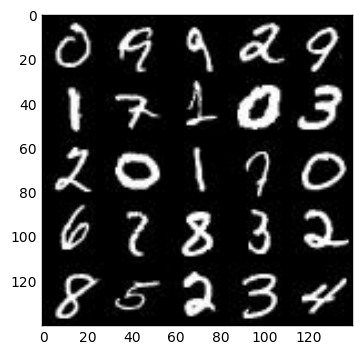

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

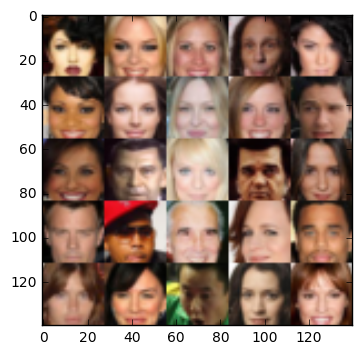

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, name='learning_rate')

    return input_real, input_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.1):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='SAME')
        x1 = tf.maximum(alpha*x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='SAME')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha*x2, x2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='SAME')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha*x3, x3)
        # 4x4x256
        
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.1):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_train): #why not reuse=reuse?
        x1a = tf.layers.dense(z, 7*7*1024)
        x1a = tf.reshape(x1a, (-1, 7, 7, 1024))
        x1a = tf.layers.batch_normalization(x1a, training=is_train)
        x1a = tf.maximum(alpha*x1a, x1a)
        # 7x7x1024
        
        #x1 = tf.layers.conv2d_transpose(x1a, 512, 5, strides=1, padding='SAME')
        #x1 = tf.layers.batch_normalization(x1, training=is_train)
        #x1 = tf.maximum(alpha*x1, x1)
        # 7x7x512
        
        x2 = tf.layers.conv2d_transpose(x1a, 256, 5, strides=2, padding='SAME')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)
        # 14x14x256
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='SAME')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)
        # 28x28x64
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=1, padding='SAME')
        out = tf.tanh(logits)
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))    
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    #based on suggestion from forum
    """We force both d_train_opt and g_train_opt to depend on tf.GraphKeys.UPDATE_OPS being finished.
    The tf.GraphKeys.UPDATE_OPS basically compute the mean and the deviation for normalizing the output. 
    This means that they depend on input_real.
    Thus, g_train_opt, that artificially depends on tf.GraphKeys.UPDATE_OPS, will also depend on input_real."""
    
    vars = tf.trainable_variables()
    d_vars = [var for var in vars if var.name.startswith('discriminator')]
    g_vars = [var for var in vars if var.name.startswith('generator')]
    all_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

    g_update_ops = [var for var in all_update_ops if var.name.startswith('generator')]
    d_update_ops = [var for var in all_update_ops if var.name.startswith('discriminator')]

    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
tf.reset_default_graph()

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, img_w, img_h, img_d = data_shape
    input_real, input_z, lr = model_inputs(img_w, img_h, img_d, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, img_d)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)

    samples = []
    steps = 0
    
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                #TODO: Train Model.
                steps += 1
                batch_images =  batch_images * 2.0
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, lr: learning_rate})
                
                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, img_d, data_image_mode)
                
                if steps % 10 == 0:                    
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
        saver.save(sess, './generator.ckpt')
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.0516... Generator Loss: 0.7886
Epoch 1/2... Discriminator Loss: 0.5341... Generator Loss: 1.8507
Epoch 1/2... Discriminator Loss: 0.6572... Generator Loss: 1.5587
Epoch 1/2... Discriminator Loss: 0.4449... Generator Loss: 2.4415
Epoch 1/2... Discriminator Loss: 1.0839... Generator Loss: 1.1640
Epoch 1/2... Discriminator Loss: 0.7491... Generator Loss: 1.7275
Epoch 1/2... Discriminator Loss: 0.6227... Generator Loss: 1.7389
Epoch 1/2... Discriminator Loss: 1.0882... Generator Loss: 1.1757
Epoch 1/2... Discriminator Loss: 1.5173... Generator Loss: 1.3637


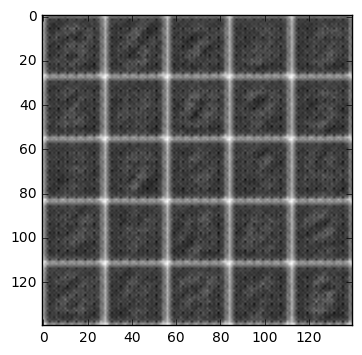

Epoch 1/2... Discriminator Loss: 1.5067... Generator Loss: 0.5182
Epoch 1/2... Discriminator Loss: 1.3522... Generator Loss: 0.7935
Epoch 1/2... Discriminator Loss: 1.4050... Generator Loss: 0.8029
Epoch 1/2... Discriminator Loss: 1.3733... Generator Loss: 0.8175
Epoch 1/2... Discriminator Loss: 1.2063... Generator Loss: 0.8687
Epoch 1/2... Discriminator Loss: 1.6213... Generator Loss: 0.4849
Epoch 1/2... Discriminator Loss: 1.6194... Generator Loss: 0.3807
Epoch 1/2... Discriminator Loss: 1.3790... Generator Loss: 0.6890
Epoch 1/2... Discriminator Loss: 1.3374... Generator Loss: 0.6631
Epoch 1/2... Discriminator Loss: 1.1712... Generator Loss: 1.2510


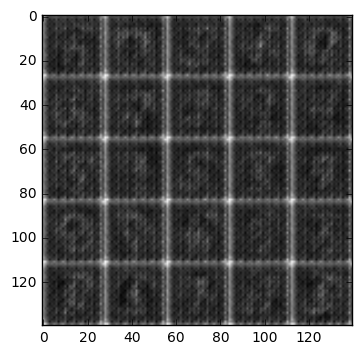

Epoch 1/2... Discriminator Loss: 1.2281... Generator Loss: 1.1623
Epoch 1/2... Discriminator Loss: 1.1455... Generator Loss: 1.2695
Epoch 1/2... Discriminator Loss: 1.1872... Generator Loss: 0.7845
Epoch 1/2... Discriminator Loss: 1.1558... Generator Loss: 1.0668
Epoch 1/2... Discriminator Loss: 1.1697... Generator Loss: 0.8697
Epoch 1/2... Discriminator Loss: 1.2166... Generator Loss: 1.8830
Epoch 1/2... Discriminator Loss: 1.1771... Generator Loss: 0.7787
Epoch 1/2... Discriminator Loss: 1.1872... Generator Loss: 0.7415
Epoch 1/2... Discriminator Loss: 1.0545... Generator Loss: 1.0461
Epoch 1/2... Discriminator Loss: 1.2153... Generator Loss: 0.6776


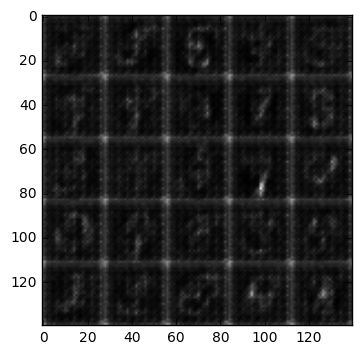

Epoch 1/2... Discriminator Loss: 1.1277... Generator Loss: 1.0685
Epoch 1/2... Discriminator Loss: 0.9893... Generator Loss: 1.3924
Epoch 1/2... Discriminator Loss: 0.9637... Generator Loss: 1.2856
Epoch 1/2... Discriminator Loss: 1.1520... Generator Loss: 0.8625
Epoch 1/2... Discriminator Loss: 1.2428... Generator Loss: 0.6039
Epoch 1/2... Discriminator Loss: 0.9039... Generator Loss: 1.2762
Epoch 1/2... Discriminator Loss: 0.8875... Generator Loss: 1.4913
Epoch 1/2... Discriminator Loss: 0.8687... Generator Loss: 1.4960
Epoch 1/2... Discriminator Loss: 0.9952... Generator Loss: 0.9360
Epoch 1/2... Discriminator Loss: 1.0074... Generator Loss: 1.0832


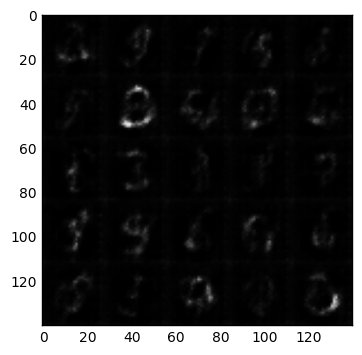

Epoch 1/2... Discriminator Loss: 0.9804... Generator Loss: 1.1041
Epoch 1/2... Discriminator Loss: 0.9624... Generator Loss: 0.9332
Epoch 1/2... Discriminator Loss: 1.3666... Generator Loss: 0.5078
Epoch 1/2... Discriminator Loss: 0.8501... Generator Loss: 1.2201
Epoch 1/2... Discriminator Loss: 1.0794... Generator Loss: 0.8509
Epoch 1/2... Discriminator Loss: 1.0147... Generator Loss: 1.4868
Epoch 1/2... Discriminator Loss: 1.3653... Generator Loss: 0.5995
Epoch 1/2... Discriminator Loss: 0.9029... Generator Loss: 1.6212
Epoch 1/2... Discriminator Loss: 1.3266... Generator Loss: 0.6433
Epoch 1/2... Discriminator Loss: 0.9819... Generator Loss: 1.3193


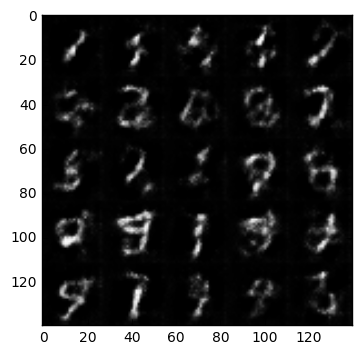

Epoch 1/2... Discriminator Loss: 1.0102... Generator Loss: 1.0164
Epoch 1/2... Discriminator Loss: 1.1176... Generator Loss: 0.9630
Epoch 1/2... Discriminator Loss: 1.0227... Generator Loss: 1.3938
Epoch 1/2... Discriminator Loss: 1.2139... Generator Loss: 0.7020
Epoch 1/2... Discriminator Loss: 1.1367... Generator Loss: 0.9747
Epoch 1/2... Discriminator Loss: 1.0298... Generator Loss: 0.9813
Epoch 1/2... Discriminator Loss: 1.0492... Generator Loss: 1.0964
Epoch 1/2... Discriminator Loss: 1.0995... Generator Loss: 0.8987
Epoch 1/2... Discriminator Loss: 1.1908... Generator Loss: 0.6738
Epoch 1/2... Discriminator Loss: 0.8939... Generator Loss: 1.2428


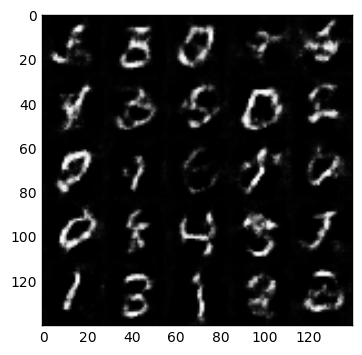

Epoch 1/2... Discriminator Loss: 1.3977... Generator Loss: 0.5094
Epoch 1/2... Discriminator Loss: 1.1374... Generator Loss: 0.9462
Epoch 1/2... Discriminator Loss: 1.1308... Generator Loss: 0.9110
Epoch 1/2... Discriminator Loss: 1.1741... Generator Loss: 1.0923
Epoch 1/2... Discriminator Loss: 1.0954... Generator Loss: 0.9322
Epoch 1/2... Discriminator Loss: 1.2541... Generator Loss: 0.6492
Epoch 1/2... Discriminator Loss: 1.1808... Generator Loss: 1.2863
Epoch 1/2... Discriminator Loss: 1.0669... Generator Loss: 1.2724
Epoch 1/2... Discriminator Loss: 1.1948... Generator Loss: 0.7979
Epoch 1/2... Discriminator Loss: 1.1979... Generator Loss: 0.7139


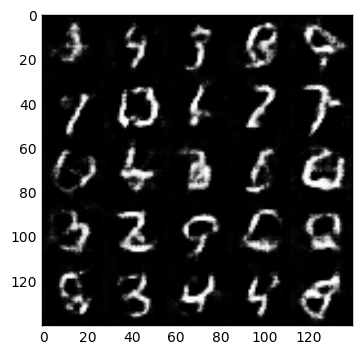

Epoch 1/2... Discriminator Loss: 1.1037... Generator Loss: 0.9111
Epoch 1/2... Discriminator Loss: 1.3229... Generator Loss: 0.5623
Epoch 1/2... Discriminator Loss: 0.9919... Generator Loss: 1.2627
Epoch 1/2... Discriminator Loss: 1.1988... Generator Loss: 1.2941
Epoch 1/2... Discriminator Loss: 1.1458... Generator Loss: 1.0666
Epoch 1/2... Discriminator Loss: 1.0747... Generator Loss: 1.1539
Epoch 1/2... Discriminator Loss: 1.0588... Generator Loss: 0.8524
Epoch 1/2... Discriminator Loss: 1.3240... Generator Loss: 0.7022
Epoch 1/2... Discriminator Loss: 1.1152... Generator Loss: 0.9469
Epoch 1/2... Discriminator Loss: 1.0571... Generator Loss: 0.8964


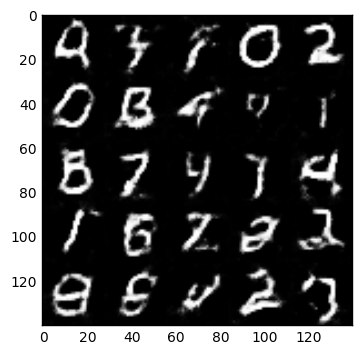

Epoch 1/2... Discriminator Loss: 1.0293... Generator Loss: 1.1699
Epoch 1/2... Discriminator Loss: 1.5747... Generator Loss: 0.4032
Epoch 1/2... Discriminator Loss: 1.0846... Generator Loss: 1.2985
Epoch 1/2... Discriminator Loss: 1.3495... Generator Loss: 0.6169
Epoch 1/2... Discriminator Loss: 1.3718... Generator Loss: 0.5286
Epoch 1/2... Discriminator Loss: 1.1256... Generator Loss: 0.8969
Epoch 1/2... Discriminator Loss: 1.1158... Generator Loss: 0.7887
Epoch 1/2... Discriminator Loss: 1.2113... Generator Loss: 1.2916
Epoch 1/2... Discriminator Loss: 1.3532... Generator Loss: 0.6408
Epoch 1/2... Discriminator Loss: 0.9963... Generator Loss: 0.9953


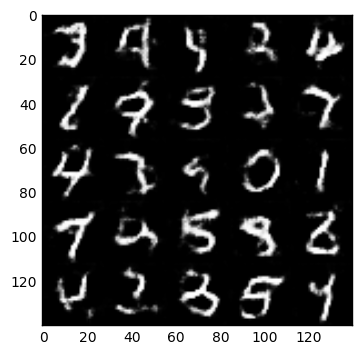

Epoch 1/2... Discriminator Loss: 1.3709... Generator Loss: 0.5613
Epoch 1/2... Discriminator Loss: 1.1634... Generator Loss: 1.0203
Epoch 1/2... Discriminator Loss: 1.2627... Generator Loss: 0.8787
Epoch 1/2... Discriminator Loss: 1.1290... Generator Loss: 1.0789
Epoch 1/2... Discriminator Loss: 1.2027... Generator Loss: 0.7972
Epoch 1/2... Discriminator Loss: 1.1965... Generator Loss: 0.6778
Epoch 1/2... Discriminator Loss: 1.0737... Generator Loss: 1.1502
Epoch 1/2... Discriminator Loss: 1.0635... Generator Loss: 0.9295
Epoch 1/2... Discriminator Loss: 1.0195... Generator Loss: 1.0660
Epoch 1/2... Discriminator Loss: 1.1807... Generator Loss: 0.7604


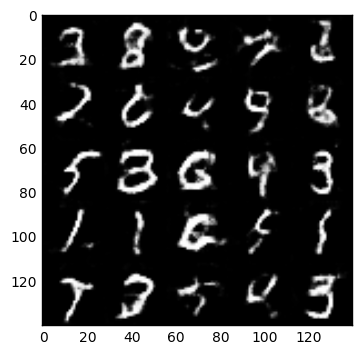

Epoch 1/2... Discriminator Loss: 1.2006... Generator Loss: 0.6837
Epoch 1/2... Discriminator Loss: 1.3186... Generator Loss: 0.5342
Epoch 1/2... Discriminator Loss: 1.2395... Generator Loss: 0.8016
Epoch 1/2... Discriminator Loss: 1.2896... Generator Loss: 0.6034
Epoch 1/2... Discriminator Loss: 1.0650... Generator Loss: 1.0284
Epoch 1/2... Discriminator Loss: 1.2276... Generator Loss: 1.4613
Epoch 1/2... Discriminator Loss: 1.4153... Generator Loss: 0.5005
Epoch 1/2... Discriminator Loss: 1.1742... Generator Loss: 0.9472
Epoch 1/2... Discriminator Loss: 1.0936... Generator Loss: 0.7575
Epoch 1/2... Discriminator Loss: 1.0203... Generator Loss: 1.0232


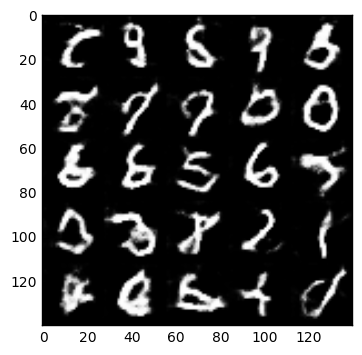

Epoch 1/2... Discriminator Loss: 1.0739... Generator Loss: 0.9844
Epoch 1/2... Discriminator Loss: 1.1364... Generator Loss: 0.8415
Epoch 1/2... Discriminator Loss: 1.1793... Generator Loss: 1.1492
Epoch 1/2... Discriminator Loss: 0.9576... Generator Loss: 1.2944
Epoch 1/2... Discriminator Loss: 1.0120... Generator Loss: 0.9848
Epoch 1/2... Discriminator Loss: 1.1176... Generator Loss: 0.7915
Epoch 1/2... Discriminator Loss: 1.0805... Generator Loss: 0.9198
Epoch 1/2... Discriminator Loss: 1.2144... Generator Loss: 0.7437
Epoch 1/2... Discriminator Loss: 1.3288... Generator Loss: 0.6052
Epoch 1/2... Discriminator Loss: 0.9726... Generator Loss: 1.0736


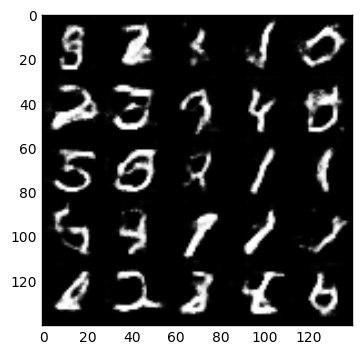

Epoch 1/2... Discriminator Loss: 1.1697... Generator Loss: 0.6865
Epoch 1/2... Discriminator Loss: 1.1762... Generator Loss: 1.3113
Epoch 1/2... Discriminator Loss: 0.9500... Generator Loss: 1.1924
Epoch 1/2... Discriminator Loss: 1.1087... Generator Loss: 1.0297
Epoch 1/2... Discriminator Loss: 0.9973... Generator Loss: 1.0180
Epoch 1/2... Discriminator Loss: 1.2341... Generator Loss: 0.6188
Epoch 1/2... Discriminator Loss: 1.1930... Generator Loss: 0.7280
Epoch 1/2... Discriminator Loss: 0.9798... Generator Loss: 0.9193
Epoch 1/2... Discriminator Loss: 0.9118... Generator Loss: 1.4657
Epoch 1/2... Discriminator Loss: 1.0432... Generator Loss: 0.9711


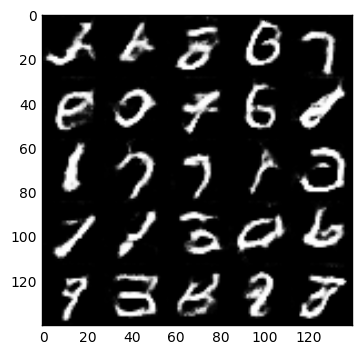

Epoch 1/2... Discriminator Loss: 1.1597... Generator Loss: 1.4141
Epoch 1/2... Discriminator Loss: 0.9723... Generator Loss: 1.0413
Epoch 1/2... Discriminator Loss: 1.0147... Generator Loss: 1.0593
Epoch 1/2... Discriminator Loss: 1.0179... Generator Loss: 1.1134
Epoch 1/2... Discriminator Loss: 1.0779... Generator Loss: 0.7681
Epoch 1/2... Discriminator Loss: 1.1642... Generator Loss: 0.9499
Epoch 1/2... Discriminator Loss: 1.0722... Generator Loss: 1.1106
Epoch 1/2... Discriminator Loss: 1.2051... Generator Loss: 0.7381
Epoch 1/2... Discriminator Loss: 1.4106... Generator Loss: 0.4796
Epoch 1/2... Discriminator Loss: 1.0338... Generator Loss: 0.9319


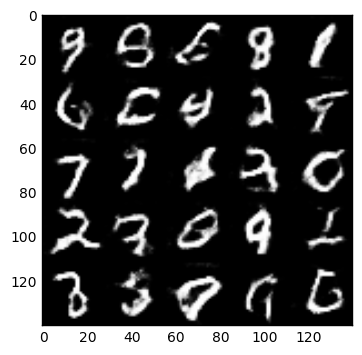

Epoch 1/2... Discriminator Loss: 1.1810... Generator Loss: 0.7262
Epoch 1/2... Discriminator Loss: 1.6307... Generator Loss: 0.4151
Epoch 1/2... Discriminator Loss: 0.9424... Generator Loss: 1.1370
Epoch 1/2... Discriminator Loss: 1.5077... Generator Loss: 0.4965
Epoch 1/2... Discriminator Loss: 1.3201... Generator Loss: 0.5778
Epoch 1/2... Discriminator Loss: 1.0781... Generator Loss: 0.9344
Epoch 1/2... Discriminator Loss: 1.2763... Generator Loss: 0.5967
Epoch 1/2... Discriminator Loss: 1.0062... Generator Loss: 1.0583
Epoch 1/2... Discriminator Loss: 1.3256... Generator Loss: 0.6852
Epoch 1/2... Discriminator Loss: 1.0752... Generator Loss: 1.1236


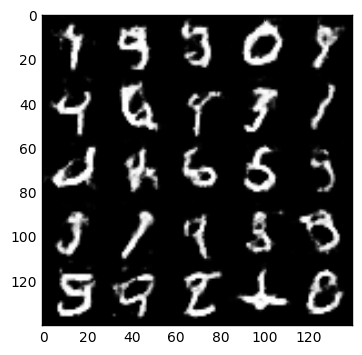

Epoch 1/2... Discriminator Loss: 1.0353... Generator Loss: 0.8418
Epoch 1/2... Discriminator Loss: 1.0281... Generator Loss: 0.9319
Epoch 1/2... Discriminator Loss: 1.0994... Generator Loss: 0.8494
Epoch 1/2... Discriminator Loss: 1.1372... Generator Loss: 0.8517
Epoch 1/2... Discriminator Loss: 1.1112... Generator Loss: 0.7614
Epoch 1/2... Discriminator Loss: 1.0705... Generator Loss: 1.1383
Epoch 1/2... Discriminator Loss: 0.9528... Generator Loss: 0.9553
Epoch 1/2... Discriminator Loss: 0.9156... Generator Loss: 1.1249
Epoch 1/2... Discriminator Loss: 0.8921... Generator Loss: 1.1956
Epoch 1/2... Discriminator Loss: 1.2121... Generator Loss: 0.6922


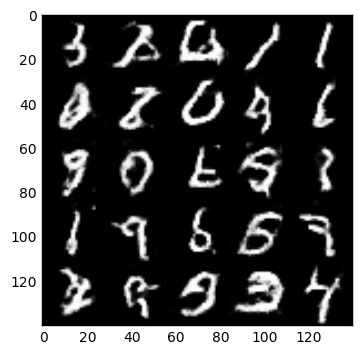

Epoch 1/2... Discriminator Loss: 0.9432... Generator Loss: 1.1868
Epoch 1/2... Discriminator Loss: 1.0762... Generator Loss: 0.8819
Epoch 1/2... Discriminator Loss: 1.2228... Generator Loss: 0.6092
Epoch 1/2... Discriminator Loss: 0.9989... Generator Loss: 1.1372
Epoch 1/2... Discriminator Loss: 0.9236... Generator Loss: 0.9613
Epoch 1/2... Discriminator Loss: 0.9628... Generator Loss: 0.9770
Epoch 1/2... Discriminator Loss: 0.9612... Generator Loss: 1.0261
Epoch 1/2... Discriminator Loss: 0.8614... Generator Loss: 1.5952
Epoch 1/2... Discriminator Loss: 1.2156... Generator Loss: 0.6862
Epoch 1/2... Discriminator Loss: 0.9678... Generator Loss: 1.2324


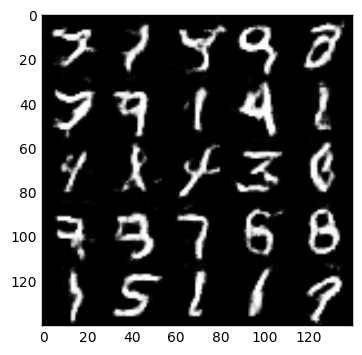

Epoch 1/2... Discriminator Loss: 1.0460... Generator Loss: 0.8429
Epoch 1/2... Discriminator Loss: 1.0387... Generator Loss: 1.6030
Epoch 1/2... Discriminator Loss: 1.0291... Generator Loss: 0.8493
Epoch 1/2... Discriminator Loss: 0.9727... Generator Loss: 0.9607
Epoch 1/2... Discriminator Loss: 0.9559... Generator Loss: 1.6961
Epoch 1/2... Discriminator Loss: 1.0779... Generator Loss: 0.8348
Epoch 1/2... Discriminator Loss: 1.1813... Generator Loss: 0.6595
Epoch 1/2... Discriminator Loss: 0.8933... Generator Loss: 1.7493
Epoch 1/2... Discriminator Loss: 0.9093... Generator Loss: 1.2156
Epoch 1/2... Discriminator Loss: 1.0629... Generator Loss: 0.8101


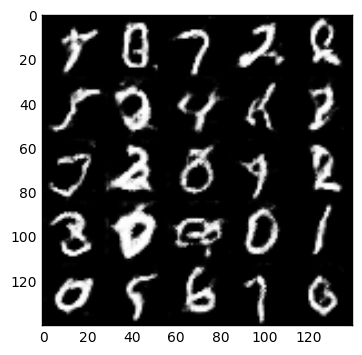

Epoch 1/2... Discriminator Loss: 1.0070... Generator Loss: 0.8895
Epoch 1/2... Discriminator Loss: 1.0332... Generator Loss: 0.9381
Epoch 1/2... Discriminator Loss: 0.8988... Generator Loss: 1.1919
Epoch 1/2... Discriminator Loss: 0.9314... Generator Loss: 1.3403
Epoch 1/2... Discriminator Loss: 1.0127... Generator Loss: 1.7708
Epoch 1/2... Discriminator Loss: 0.9043... Generator Loss: 1.0111
Epoch 1/2... Discriminator Loss: 0.8583... Generator Loss: 1.1118
Epoch 1/2... Discriminator Loss: 1.0667... Generator Loss: 2.3320
Epoch 2/2... Discriminator Loss: 0.9189... Generator Loss: 1.0015
Epoch 2/2... Discriminator Loss: 1.1748... Generator Loss: 0.7390


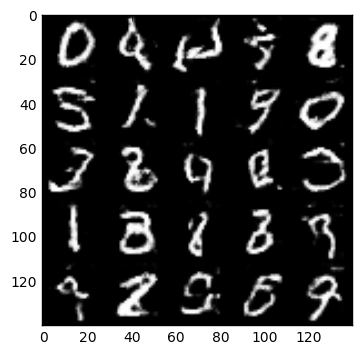

Epoch 2/2... Discriminator Loss: 1.0375... Generator Loss: 1.0218
Epoch 2/2... Discriminator Loss: 1.4433... Generator Loss: 0.4617
Epoch 2/2... Discriminator Loss: 0.8638... Generator Loss: 1.1245
Epoch 2/2... Discriminator Loss: 1.1168... Generator Loss: 0.7715
Epoch 2/2... Discriminator Loss: 1.0096... Generator Loss: 0.8397
Epoch 2/2... Discriminator Loss: 1.0092... Generator Loss: 0.8953
Epoch 2/2... Discriminator Loss: 0.9464... Generator Loss: 1.1053
Epoch 2/2... Discriminator Loss: 0.8720... Generator Loss: 1.0772
Epoch 2/2... Discriminator Loss: 1.0441... Generator Loss: 0.8240
Epoch 2/2... Discriminator Loss: 0.9891... Generator Loss: 1.0488


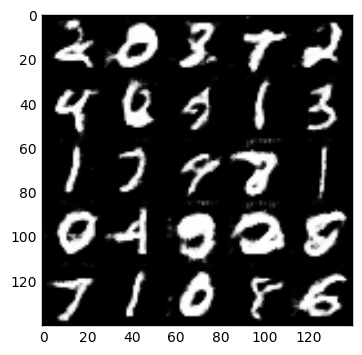

Epoch 2/2... Discriminator Loss: 1.0095... Generator Loss: 1.3384
Epoch 2/2... Discriminator Loss: 0.9724... Generator Loss: 0.9058
Epoch 2/2... Discriminator Loss: 0.8101... Generator Loss: 1.2677
Epoch 2/2... Discriminator Loss: 0.9308... Generator Loss: 1.4157
Epoch 2/2... Discriminator Loss: 0.9928... Generator Loss: 1.0751
Epoch 2/2... Discriminator Loss: 0.9210... Generator Loss: 1.2906
Epoch 2/2... Discriminator Loss: 0.8058... Generator Loss: 1.2422
Epoch 2/2... Discriminator Loss: 1.0676... Generator Loss: 0.8124
Epoch 2/2... Discriminator Loss: 0.8829... Generator Loss: 1.0664
Epoch 2/2... Discriminator Loss: 1.1745... Generator Loss: 0.6796


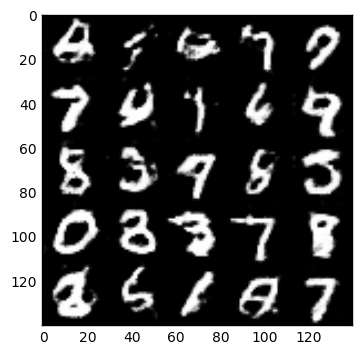

Epoch 2/2... Discriminator Loss: 0.8855... Generator Loss: 1.0717
Epoch 2/2... Discriminator Loss: 0.8698... Generator Loss: 1.0032
Epoch 2/2... Discriminator Loss: 0.8976... Generator Loss: 1.0736
Epoch 2/2... Discriminator Loss: 1.1010... Generator Loss: 0.7424
Epoch 2/2... Discriminator Loss: 1.0889... Generator Loss: 0.8297
Epoch 2/2... Discriminator Loss: 1.1064... Generator Loss: 0.7533
Epoch 2/2... Discriminator Loss: 0.9996... Generator Loss: 0.9371
Epoch 2/2... Discriminator Loss: 0.8984... Generator Loss: 1.7229
Epoch 2/2... Discriminator Loss: 1.0237... Generator Loss: 0.8230
Epoch 2/2... Discriminator Loss: 0.9870... Generator Loss: 1.0944


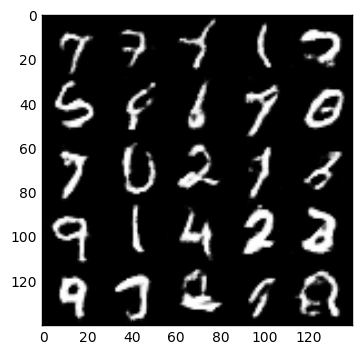

Epoch 2/2... Discriminator Loss: 1.5981... Generator Loss: 0.3957
Epoch 2/2... Discriminator Loss: 1.2749... Generator Loss: 0.5823
Epoch 2/2... Discriminator Loss: 0.9365... Generator Loss: 1.4705
Epoch 2/2... Discriminator Loss: 1.0307... Generator Loss: 0.9779
Epoch 2/2... Discriminator Loss: 0.8718... Generator Loss: 1.4146
Epoch 2/2... Discriminator Loss: 0.8936... Generator Loss: 1.3050
Epoch 2/2... Discriminator Loss: 1.0715... Generator Loss: 0.8564
Epoch 2/2... Discriminator Loss: 0.6495... Generator Loss: 1.7288
Epoch 2/2... Discriminator Loss: 1.1392... Generator Loss: 0.9103
Epoch 2/2... Discriminator Loss: 0.8039... Generator Loss: 1.4222


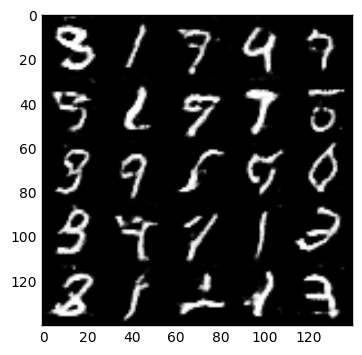

Epoch 2/2... Discriminator Loss: 0.7851... Generator Loss: 1.5549
Epoch 2/2... Discriminator Loss: 0.9496... Generator Loss: 0.9428
Epoch 2/2... Discriminator Loss: 0.9945... Generator Loss: 0.8498
Epoch 2/2... Discriminator Loss: 0.9993... Generator Loss: 0.9083
Epoch 2/2... Discriminator Loss: 0.7780... Generator Loss: 1.5758
Epoch 2/2... Discriminator Loss: 0.9794... Generator Loss: 0.8885
Epoch 2/2... Discriminator Loss: 1.0675... Generator Loss: 0.7491
Epoch 2/2... Discriminator Loss: 0.7920... Generator Loss: 1.2896
Epoch 2/2... Discriminator Loss: 0.8976... Generator Loss: 1.0571
Epoch 2/2... Discriminator Loss: 0.7775... Generator Loss: 1.4901


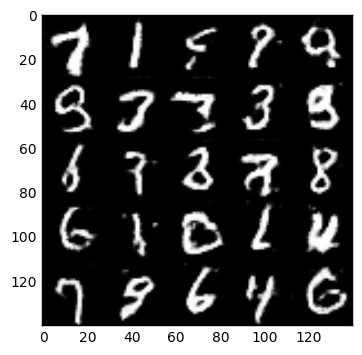

Epoch 2/2... Discriminator Loss: 0.9692... Generator Loss: 0.9463
Epoch 2/2... Discriminator Loss: 1.0805... Generator Loss: 0.8294
Epoch 2/2... Discriminator Loss: 1.0247... Generator Loss: 0.9025
Epoch 2/2... Discriminator Loss: 0.9126... Generator Loss: 1.3541
Epoch 2/2... Discriminator Loss: 0.8948... Generator Loss: 1.2538
Epoch 2/2... Discriminator Loss: 1.1966... Generator Loss: 0.6562
Epoch 2/2... Discriminator Loss: 0.8976... Generator Loss: 1.0469
Epoch 2/2... Discriminator Loss: 0.7266... Generator Loss: 1.7883
Epoch 2/2... Discriminator Loss: 1.4671... Generator Loss: 0.4510
Epoch 2/2... Discriminator Loss: 1.1549... Generator Loss: 0.6877


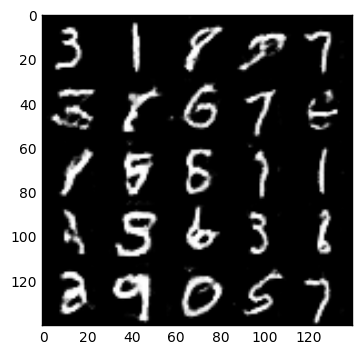

Epoch 2/2... Discriminator Loss: 0.7643... Generator Loss: 1.3105
Epoch 2/2... Discriminator Loss: 1.2399... Generator Loss: 0.6440
Epoch 2/2... Discriminator Loss: 1.1250... Generator Loss: 1.6805
Epoch 2/2... Discriminator Loss: 0.9611... Generator Loss: 0.8907
Epoch 2/2... Discriminator Loss: 0.9662... Generator Loss: 0.8781
Epoch 2/2... Discriminator Loss: 1.1879... Generator Loss: 0.7278
Epoch 2/2... Discriminator Loss: 0.8335... Generator Loss: 1.5188
Epoch 2/2... Discriminator Loss: 0.7951... Generator Loss: 1.3235
Epoch 2/2... Discriminator Loss: 0.8855... Generator Loss: 1.3789
Epoch 2/2... Discriminator Loss: 1.1326... Generator Loss: 0.9560


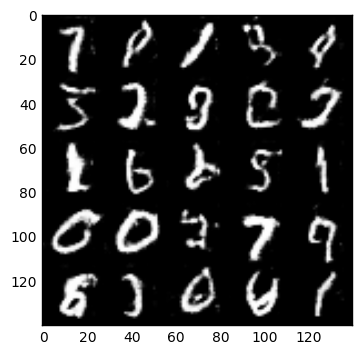

Epoch 2/2... Discriminator Loss: 1.0051... Generator Loss: 0.9413
Epoch 2/2... Discriminator Loss: 0.9224... Generator Loss: 1.9114
Epoch 2/2... Discriminator Loss: 0.8226... Generator Loss: 1.2390
Epoch 2/2... Discriminator Loss: 0.8130... Generator Loss: 1.4961
Epoch 2/2... Discriminator Loss: 1.0267... Generator Loss: 1.9020
Epoch 2/2... Discriminator Loss: 0.9688... Generator Loss: 0.8999
Epoch 2/2... Discriminator Loss: 1.1820... Generator Loss: 0.6556
Epoch 2/2... Discriminator Loss: 0.8597... Generator Loss: 1.0899
Epoch 2/2... Discriminator Loss: 0.8282... Generator Loss: 1.3789
Epoch 2/2... Discriminator Loss: 0.7261... Generator Loss: 1.6521


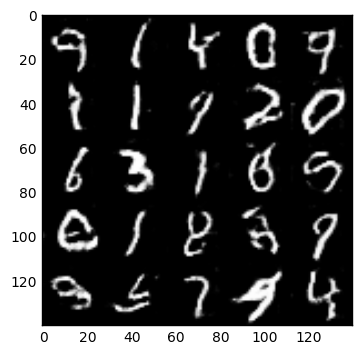

Epoch 2/2... Discriminator Loss: 1.0205... Generator Loss: 1.7995
Epoch 2/2... Discriminator Loss: 0.9772... Generator Loss: 1.2499
Epoch 2/2... Discriminator Loss: 0.8318... Generator Loss: 1.5307
Epoch 2/2... Discriminator Loss: 0.9750... Generator Loss: 0.9331
Epoch 2/2... Discriminator Loss: 0.9070... Generator Loss: 1.0604
Epoch 2/2... Discriminator Loss: 0.9850... Generator Loss: 0.9474
Epoch 2/2... Discriminator Loss: 0.9567... Generator Loss: 0.9529
Epoch 2/2... Discriminator Loss: 0.9646... Generator Loss: 2.0403
Epoch 2/2... Discriminator Loss: 0.9126... Generator Loss: 1.2217
Epoch 2/2... Discriminator Loss: 1.0225... Generator Loss: 0.7935


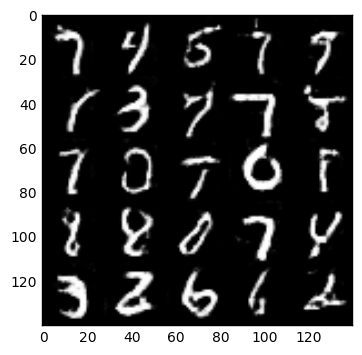

Epoch 2/2... Discriminator Loss: 0.6463... Generator Loss: 1.8484
Epoch 2/2... Discriminator Loss: 0.7319... Generator Loss: 1.6647
Epoch 2/2... Discriminator Loss: 0.7531... Generator Loss: 1.3016
Epoch 2/2... Discriminator Loss: 0.7436... Generator Loss: 1.3116
Epoch 2/2... Discriminator Loss: 1.2740... Generator Loss: 0.5591
Epoch 2/2... Discriminator Loss: 0.9326... Generator Loss: 1.2278
Epoch 2/2... Discriminator Loss: 0.9864... Generator Loss: 0.8890
Epoch 2/2... Discriminator Loss: 0.7282... Generator Loss: 1.4535
Epoch 2/2... Discriminator Loss: 0.9328... Generator Loss: 1.0025
Epoch 2/2... Discriminator Loss: 1.2534... Generator Loss: 0.6503


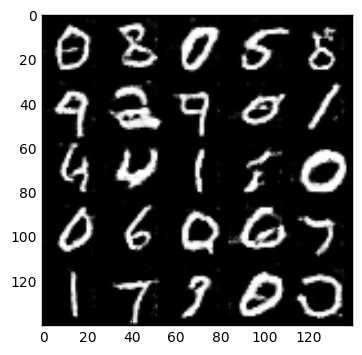

Epoch 2/2... Discriminator Loss: 0.9598... Generator Loss: 1.3809
Epoch 2/2... Discriminator Loss: 0.8981... Generator Loss: 1.2021
Epoch 2/2... Discriminator Loss: 0.8302... Generator Loss: 1.8406
Epoch 2/2... Discriminator Loss: 1.0105... Generator Loss: 1.0792
Epoch 2/2... Discriminator Loss: 0.9687... Generator Loss: 0.9856
Epoch 2/2... Discriminator Loss: 0.8168... Generator Loss: 1.3159
Epoch 2/2... Discriminator Loss: 1.0654... Generator Loss: 1.7445
Epoch 2/2... Discriminator Loss: 0.7460... Generator Loss: 1.4487
Epoch 2/2... Discriminator Loss: 0.8261... Generator Loss: 1.0560
Epoch 2/2... Discriminator Loss: 0.7912... Generator Loss: 1.3702


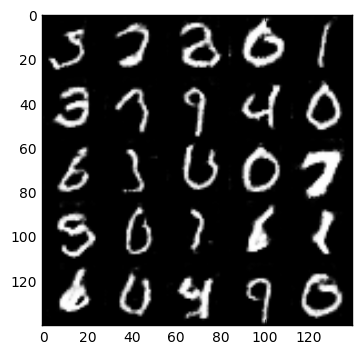

Epoch 2/2... Discriminator Loss: 0.9208... Generator Loss: 0.9224
Epoch 2/2... Discriminator Loss: 0.8936... Generator Loss: 1.0572
Epoch 2/2... Discriminator Loss: 0.9523... Generator Loss: 0.9925
Epoch 2/2... Discriminator Loss: 0.8060... Generator Loss: 1.1575
Epoch 2/2... Discriminator Loss: 0.8386... Generator Loss: 1.0994
Epoch 2/2... Discriminator Loss: 0.8456... Generator Loss: 1.2721
Epoch 2/2... Discriminator Loss: 0.9484... Generator Loss: 0.9617
Epoch 2/2... Discriminator Loss: 1.1435... Generator Loss: 0.7293
Epoch 2/2... Discriminator Loss: 0.9315... Generator Loss: 0.9933
Epoch 2/2... Discriminator Loss: 0.8441... Generator Loss: 1.2765


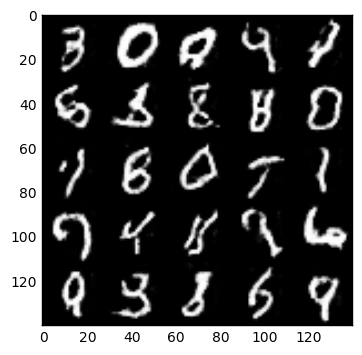

Epoch 2/2... Discriminator Loss: 0.9760... Generator Loss: 0.8686
Epoch 2/2... Discriminator Loss: 1.0479... Generator Loss: 0.8007
Epoch 2/2... Discriminator Loss: 0.9473... Generator Loss: 0.9602
Epoch 2/2... Discriminator Loss: 0.7773... Generator Loss: 1.2664
Epoch 2/2... Discriminator Loss: 0.8761... Generator Loss: 1.0003
Epoch 2/2... Discriminator Loss: 0.8523... Generator Loss: 1.0968
Epoch 2/2... Discriminator Loss: 1.4941... Generator Loss: 0.4469
Epoch 2/2... Discriminator Loss: 0.9043... Generator Loss: 0.9549
Epoch 2/2... Discriminator Loss: 1.0200... Generator Loss: 0.8474
Epoch 2/2... Discriminator Loss: 0.8408... Generator Loss: 1.2987


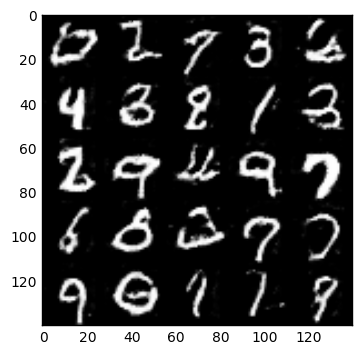

Epoch 2/2... Discriminator Loss: 0.9407... Generator Loss: 1.0859
Epoch 2/2... Discriminator Loss: 1.1209... Generator Loss: 0.7326
Epoch 2/2... Discriminator Loss: 0.8554... Generator Loss: 1.0183
Epoch 2/2... Discriminator Loss: 1.0399... Generator Loss: 0.8396
Epoch 2/2... Discriminator Loss: 0.8820... Generator Loss: 1.1626
Epoch 2/2... Discriminator Loss: 1.5252... Generator Loss: 0.4960
Epoch 2/2... Discriminator Loss: 0.8352... Generator Loss: 1.3577
Epoch 2/2... Discriminator Loss: 0.8375... Generator Loss: 1.0826
Epoch 2/2... Discriminator Loss: 1.2854... Generator Loss: 0.5552
Epoch 2/2... Discriminator Loss: 1.0932... Generator Loss: 0.8247


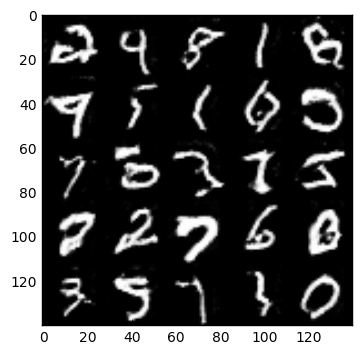

Epoch 2/2... Discriminator Loss: 0.9791... Generator Loss: 0.8678
Epoch 2/2... Discriminator Loss: 0.8174... Generator Loss: 1.5705
Epoch 2/2... Discriminator Loss: 0.9991... Generator Loss: 0.9465
Epoch 2/2... Discriminator Loss: 0.9308... Generator Loss: 1.0361
Epoch 2/2... Discriminator Loss: 0.7819... Generator Loss: 1.2000
Epoch 2/2... Discriminator Loss: 0.6998... Generator Loss: 1.7125
Epoch 2/2... Discriminator Loss: 0.8028... Generator Loss: 1.3714
Epoch 2/2... Discriminator Loss: 0.8515... Generator Loss: 1.6820
Epoch 2/2... Discriminator Loss: 1.0846... Generator Loss: 0.7564
Epoch 2/2... Discriminator Loss: 0.9560... Generator Loss: 0.9265


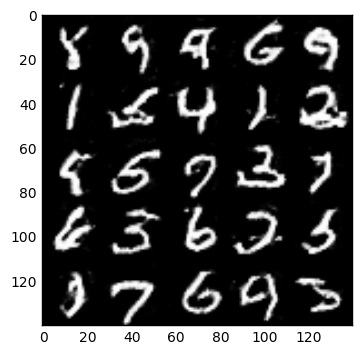

Epoch 2/2... Discriminator Loss: 0.9391... Generator Loss: 0.9910
Epoch 2/2... Discriminator Loss: 0.8458... Generator Loss: 1.2201
Epoch 2/2... Discriminator Loss: 0.9865... Generator Loss: 1.1389
Epoch 2/2... Discriminator Loss: 0.8551... Generator Loss: 1.1405
Epoch 2/2... Discriminator Loss: 0.8761... Generator Loss: 1.0419
Epoch 2/2... Discriminator Loss: 1.0591... Generator Loss: 0.9549
Epoch 2/2... Discriminator Loss: 1.5474... Generator Loss: 0.4315
Epoch 2/2... Discriminator Loss: 1.0263... Generator Loss: 0.7770
Epoch 2/2... Discriminator Loss: 0.8421... Generator Loss: 1.4034
Epoch 2/2... Discriminator Loss: 0.8817... Generator Loss: 1.2051


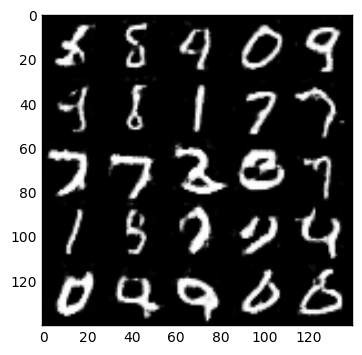

Epoch 2/2... Discriminator Loss: 0.8079... Generator Loss: 1.2407
Epoch 2/2... Discriminator Loss: 0.7794... Generator Loss: 1.6591
Epoch 2/2... Discriminator Loss: 0.8817... Generator Loss: 1.3647
Epoch 2/2... Discriminator Loss: 0.7656... Generator Loss: 1.2453
Epoch 2/2... Discriminator Loss: 0.8395... Generator Loss: 1.2969
Epoch 2/2... Discriminator Loss: 1.0255... Generator Loss: 0.8391
Epoch 2/2... Discriminator Loss: 1.0115... Generator Loss: 0.8097
Epoch 2/2... Discriminator Loss: 1.1392... Generator Loss: 0.7729
Epoch 2/2... Discriminator Loss: 0.9276... Generator Loss: 1.0742
Epoch 2/2... Discriminator Loss: 1.1649... Generator Loss: 0.6772


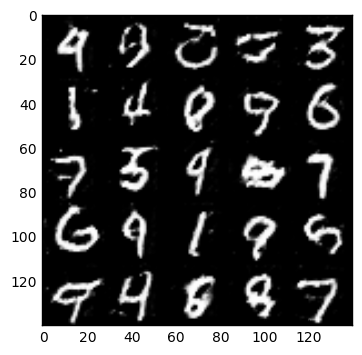

Epoch 2/2... Discriminator Loss: 0.7680... Generator Loss: 1.3479
Epoch 2/2... Discriminator Loss: 0.8278... Generator Loss: 1.5335
Epoch 2/2... Discriminator Loss: 0.8086... Generator Loss: 1.3925
Epoch 2/2... Discriminator Loss: 0.8542... Generator Loss: 1.0617
Epoch 2/2... Discriminator Loss: 0.8474... Generator Loss: 1.0973
Epoch 2/2... Discriminator Loss: 0.7395... Generator Loss: 1.3449
Epoch 2/2... Discriminator Loss: 0.8094... Generator Loss: 1.2661
Epoch 2/2... Discriminator Loss: 0.8155... Generator Loss: 1.5614
Epoch 2/2... Discriminator Loss: 1.2641... Generator Loss: 0.6274
Epoch 2/2... Discriminator Loss: 0.7823... Generator Loss: 1.3152


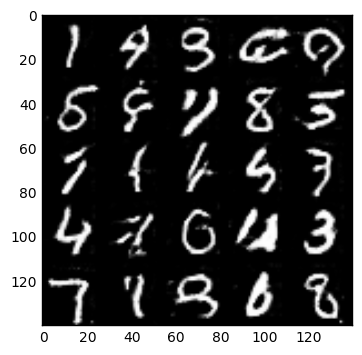

Epoch 2/2... Discriminator Loss: 1.5305... Generator Loss: 0.5403
Epoch 2/2... Discriminator Loss: 0.7657... Generator Loss: 1.5201
Epoch 2/2... Discriminator Loss: 1.1291... Generator Loss: 0.7104
Epoch 2/2... Discriminator Loss: 0.9635... Generator Loss: 0.9359
Epoch 2/2... Discriminator Loss: 0.8572... Generator Loss: 1.1549
Epoch 2/2... Discriminator Loss: 0.6178... Generator Loss: 1.8745


In [15]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 2.2742... Generator Loss: 0.2464
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.6261
Epoch 1/1... Discriminator Loss: 1.2325... Generator Loss: 0.7301
Epoch 1/1... Discriminator Loss: 0.9929... Generator Loss: 0.9222
Epoch 1/1... Discriminator Loss: 1.3384... Generator Loss: 0.6134
Epoch 1/1... Discriminator Loss: 1.1625... Generator Loss: 0.9122
Epoch 1/1... Discriminator Loss: 1.2240... Generator Loss: 0.9443
Epoch 1/1... Discriminator Loss: 1.1499... Generator Loss: 1.1308
Epoch 1/1... Discriminator Loss: 1.4361... Generator Loss: 1.1782


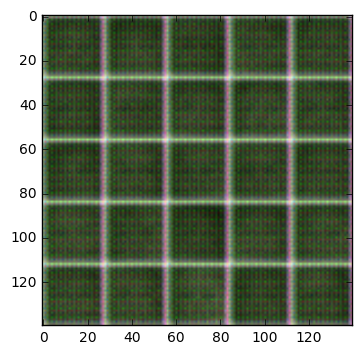

Epoch 1/1... Discriminator Loss: 1.0315... Generator Loss: 1.0354
Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.7040
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.7456
Epoch 1/1... Discriminator Loss: 1.7811... Generator Loss: 0.3658
Epoch 1/1... Discriminator Loss: 1.3742... Generator Loss: 1.7896
Epoch 1/1... Discriminator Loss: 1.1254... Generator Loss: 0.8790
Epoch 1/1... Discriminator Loss: 0.9740... Generator Loss: 1.4892
Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.6402
Epoch 1/1... Discriminator Loss: 0.6631... Generator Loss: 2.2665
Epoch 1/1... Discriminator Loss: 1.0222... Generator Loss: 1.0185


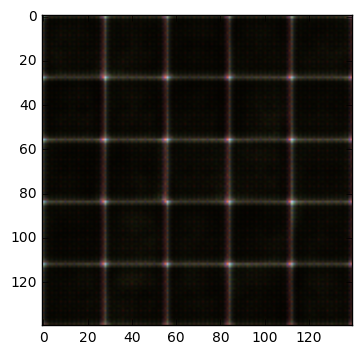

Epoch 1/1... Discriminator Loss: 0.9475... Generator Loss: 1.4096
Epoch 1/1... Discriminator Loss: 0.5802... Generator Loss: 2.1137
Epoch 1/1... Discriminator Loss: 0.8985... Generator Loss: 1.4568
Epoch 1/1... Discriminator Loss: 0.7918... Generator Loss: 2.0418
Epoch 1/1... Discriminator Loss: 0.7137... Generator Loss: 1.7216
Epoch 1/1... Discriminator Loss: 1.6234... Generator Loss: 0.5657
Epoch 1/1... Discriminator Loss: 1.1325... Generator Loss: 0.8342
Epoch 1/1... Discriminator Loss: 1.3383... Generator Loss: 0.7653
Epoch 1/1... Discriminator Loss: 0.9776... Generator Loss: 1.4035
Epoch 1/1... Discriminator Loss: 0.9231... Generator Loss: 1.4541


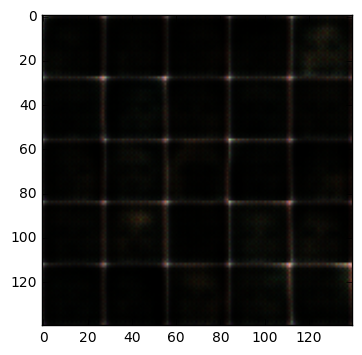

Epoch 1/1... Discriminator Loss: 1.7929... Generator Loss: 0.3743
Epoch 1/1... Discriminator Loss: 1.3661... Generator Loss: 0.5826
Epoch 1/1... Discriminator Loss: 1.1567... Generator Loss: 1.1527
Epoch 1/1... Discriminator Loss: 0.8053... Generator Loss: 1.3449
Epoch 1/1... Discriminator Loss: 0.8912... Generator Loss: 1.7155
Epoch 1/1... Discriminator Loss: 0.7331... Generator Loss: 1.4803
Epoch 1/1... Discriminator Loss: 1.2413... Generator Loss: 1.9547
Epoch 1/1... Discriminator Loss: 0.5649... Generator Loss: 2.6733
Epoch 1/1... Discriminator Loss: 0.7264... Generator Loss: 1.6605
Epoch 1/1... Discriminator Loss: 1.0253... Generator Loss: 0.8781


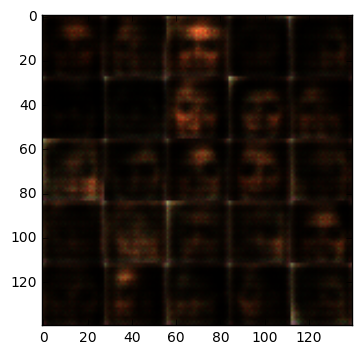

Epoch 1/1... Discriminator Loss: 0.7662... Generator Loss: 1.6136
Epoch 1/1... Discriminator Loss: 1.0988... Generator Loss: 1.0226
Epoch 1/1... Discriminator Loss: 0.8990... Generator Loss: 1.4829
Epoch 1/1... Discriminator Loss: 1.4642... Generator Loss: 0.4431
Epoch 1/1... Discriminator Loss: 0.9644... Generator Loss: 0.9084
Epoch 1/1... Discriminator Loss: 0.8708... Generator Loss: 1.2374
Epoch 1/1... Discriminator Loss: 2.5515... Generator Loss: 0.1511
Epoch 1/1... Discriminator Loss: 0.8695... Generator Loss: 1.4335
Epoch 1/1... Discriminator Loss: 1.8486... Generator Loss: 0.3852
Epoch 1/1... Discriminator Loss: 1.0326... Generator Loss: 2.9544


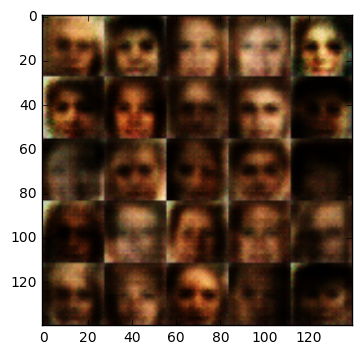

Epoch 1/1... Discriminator Loss: 1.7942... Generator Loss: 0.3190
Epoch 1/1... Discriminator Loss: 1.7917... Generator Loss: 0.3401
Epoch 1/1... Discriminator Loss: 1.1334... Generator Loss: 1.4596
Epoch 1/1... Discriminator Loss: 1.8433... Generator Loss: 0.3404
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 1.2592
Epoch 1/1... Discriminator Loss: 1.1196... Generator Loss: 0.7512
Epoch 1/1... Discriminator Loss: 1.2557... Generator Loss: 0.6983
Epoch 1/1... Discriminator Loss: 1.0889... Generator Loss: 1.2907
Epoch 1/1... Discriminator Loss: 1.0176... Generator Loss: 1.6786
Epoch 1/1... Discriminator Loss: 0.9892... Generator Loss: 0.9820


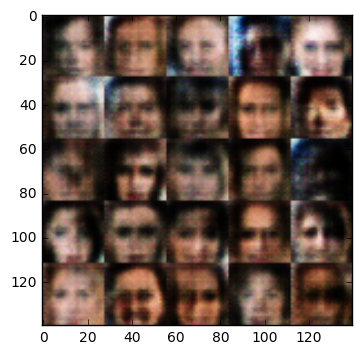

Epoch 1/1... Discriminator Loss: 1.4636... Generator Loss: 0.7152
Epoch 1/1... Discriminator Loss: 1.1586... Generator Loss: 0.6879
Epoch 1/1... Discriminator Loss: 0.7301... Generator Loss: 1.6452
Epoch 1/1... Discriminator Loss: 0.6819... Generator Loss: 2.0457
Epoch 1/1... Discriminator Loss: 0.8091... Generator Loss: 1.5771
Epoch 1/1... Discriminator Loss: 1.1670... Generator Loss: 0.8653
Epoch 1/1... Discriminator Loss: 0.8273... Generator Loss: 1.3007
Epoch 1/1... Discriminator Loss: 0.7883... Generator Loss: 1.3539
Epoch 1/1... Discriminator Loss: 0.7635... Generator Loss: 1.3763
Epoch 1/1... Discriminator Loss: 1.0243... Generator Loss: 1.0867


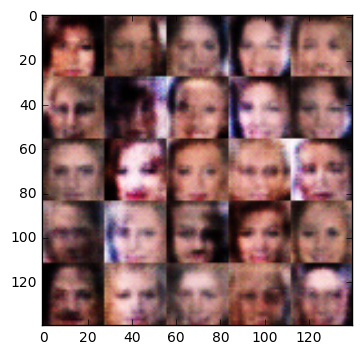

Epoch 1/1... Discriminator Loss: 1.1300... Generator Loss: 1.0625
Epoch 1/1... Discriminator Loss: 0.7466... Generator Loss: 1.5132
Epoch 1/1... Discriminator Loss: 1.0906... Generator Loss: 1.0700
Epoch 1/1... Discriminator Loss: 0.8290... Generator Loss: 1.1737
Epoch 1/1... Discriminator Loss: 0.9300... Generator Loss: 2.3759
Epoch 1/1... Discriminator Loss: 0.5523... Generator Loss: 2.2344
Epoch 1/1... Discriminator Loss: 0.8236... Generator Loss: 1.7142
Epoch 1/1... Discriminator Loss: 0.8993... Generator Loss: 1.7257
Epoch 1/1... Discriminator Loss: 0.6764... Generator Loss: 1.9537
Epoch 1/1... Discriminator Loss: 0.6369... Generator Loss: 3.6035


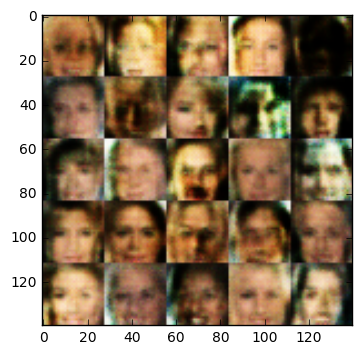

Epoch 1/1... Discriminator Loss: 0.5000... Generator Loss: 2.2355
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 2.2998
Epoch 1/1... Discriminator Loss: 0.8909... Generator Loss: 2.3456
Epoch 1/1... Discriminator Loss: 1.4079... Generator Loss: 0.6432
Epoch 1/1... Discriminator Loss: 0.9794... Generator Loss: 1.1857
Epoch 1/1... Discriminator Loss: 1.0733... Generator Loss: 1.0580
Epoch 1/1... Discriminator Loss: 1.0982... Generator Loss: 1.0102
Epoch 1/1... Discriminator Loss: 1.1757... Generator Loss: 1.1565
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.3190... Generator Loss: 0.6814


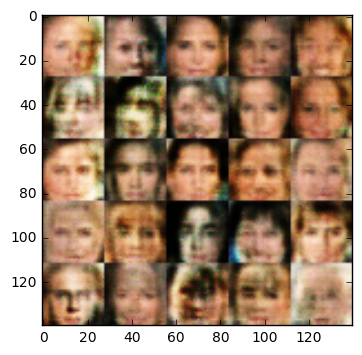

Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.8185
Epoch 1/1... Discriminator Loss: 1.1197... Generator Loss: 0.9778
Epoch 1/1... Discriminator Loss: 1.2575... Generator Loss: 0.8091
Epoch 1/1... Discriminator Loss: 1.1790... Generator Loss: 0.9113
Epoch 1/1... Discriminator Loss: 1.3009... Generator Loss: 0.8116
Epoch 1/1... Discriminator Loss: 1.1373... Generator Loss: 0.9163
Epoch 1/1... Discriminator Loss: 1.2094... Generator Loss: 0.7652
Epoch 1/1... Discriminator Loss: 1.0697... Generator Loss: 1.2346
Epoch 1/1... Discriminator Loss: 1.0971... Generator Loss: 0.9756
Epoch 1/1... Discriminator Loss: 1.1089... Generator Loss: 0.9537


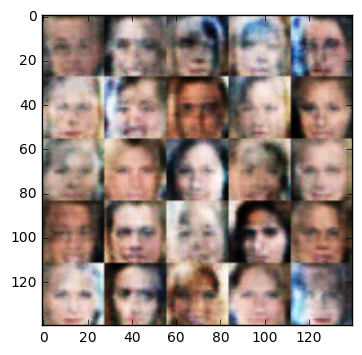

Epoch 1/1... Discriminator Loss: 1.1755... Generator Loss: 0.9238
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.8201
Epoch 1/1... Discriminator Loss: 1.2303... Generator Loss: 0.8779
Epoch 1/1... Discriminator Loss: 1.3031... Generator Loss: 0.7199
Epoch 1/1... Discriminator Loss: 1.2098... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 1.0731... Generator Loss: 1.0653
Epoch 1/1... Discriminator Loss: 1.0730... Generator Loss: 0.8907
Epoch 1/1... Discriminator Loss: 1.0503... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.6847
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 1.2928


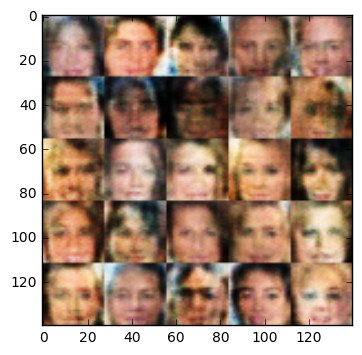

Epoch 1/1... Discriminator Loss: 1.0905... Generator Loss: 1.2771
Epoch 1/1... Discriminator Loss: 1.2733... Generator Loss: 0.8027
Epoch 1/1... Discriminator Loss: 1.1173... Generator Loss: 0.7025
Epoch 1/1... Discriminator Loss: 1.5381... Generator Loss: 0.4676
Epoch 1/1... Discriminator Loss: 0.9358... Generator Loss: 0.9504
Epoch 1/1... Discriminator Loss: 1.0096... Generator Loss: 0.8823
Epoch 1/1... Discriminator Loss: 0.8143... Generator Loss: 1.7812
Epoch 1/1... Discriminator Loss: 0.7220... Generator Loss: 1.9405
Epoch 1/1... Discriminator Loss: 1.1447... Generator Loss: 0.6837
Epoch 1/1... Discriminator Loss: 0.8238... Generator Loss: 1.8598


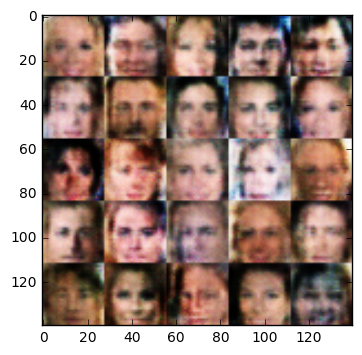

Epoch 1/1... Discriminator Loss: 1.4676... Generator Loss: 0.6279
Epoch 1/1... Discriminator Loss: 2.2522... Generator Loss: 0.1804
Epoch 1/1... Discriminator Loss: 0.9730... Generator Loss: 1.0805
Epoch 1/1... Discriminator Loss: 1.9153... Generator Loss: 0.2780
Epoch 1/1... Discriminator Loss: 1.1418... Generator Loss: 1.2375
Epoch 1/1... Discriminator Loss: 1.0950... Generator Loss: 1.0761
Epoch 1/1... Discriminator Loss: 1.1082... Generator Loss: 0.8901
Epoch 1/1... Discriminator Loss: 0.8827... Generator Loss: 1.9513
Epoch 1/1... Discriminator Loss: 0.8972... Generator Loss: 1.1391
Epoch 1/1... Discriminator Loss: 0.5587... Generator Loss: 1.9875


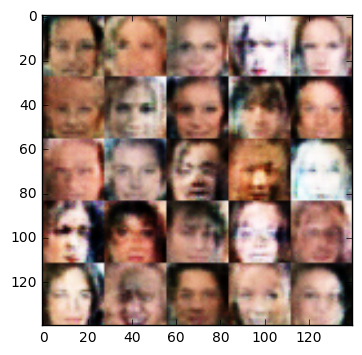

Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.1341... Generator Loss: 0.9955
Epoch 1/1... Discriminator Loss: 1.2729... Generator Loss: 0.9142
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.8291
Epoch 1/1... Discriminator Loss: 1.6627... Generator Loss: 0.5238
Epoch 1/1... Discriminator Loss: 0.8863... Generator Loss: 1.2706
Epoch 1/1... Discriminator Loss: 1.4494... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 0.8162
Epoch 1/1... Discriminator Loss: 0.9541... Generator Loss: 1.1078
Epoch 1/1... Discriminator Loss: 1.6396... Generator Loss: 0.4450


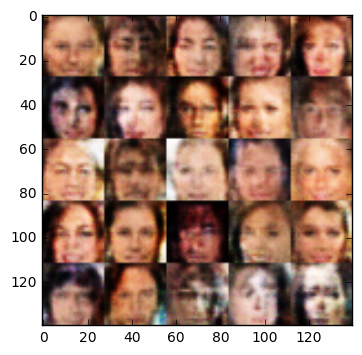

Epoch 1/1... Discriminator Loss: 1.3219... Generator Loss: 0.7999
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.6638
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.1366... Generator Loss: 0.8619
Epoch 1/1... Discriminator Loss: 1.2072... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 0.8383... Generator Loss: 1.3403
Epoch 1/1... Discriminator Loss: 1.3432... Generator Loss: 0.6089
Epoch 1/1... Discriminator Loss: 1.2304... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.7575... Generator Loss: 0.3426
Epoch 1/1... Discriminator Loss: 1.4554... Generator Loss: 0.5802


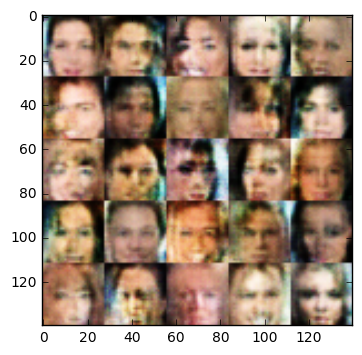

Epoch 1/1... Discriminator Loss: 1.1397... Generator Loss: 0.8826
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.7475
Epoch 1/1... Discriminator Loss: 1.0085... Generator Loss: 1.3468
Epoch 1/1... Discriminator Loss: 1.4288... Generator Loss: 0.5746
Epoch 1/1... Discriminator Loss: 0.9648... Generator Loss: 1.3424
Epoch 1/1... Discriminator Loss: 1.2548... Generator Loss: 0.7341
Epoch 1/1... Discriminator Loss: 1.0789... Generator Loss: 0.8980
Epoch 1/1... Discriminator Loss: 1.1554... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.2523... Generator Loss: 0.7451
Epoch 1/1... Discriminator Loss: 1.3455... Generator Loss: 0.7275


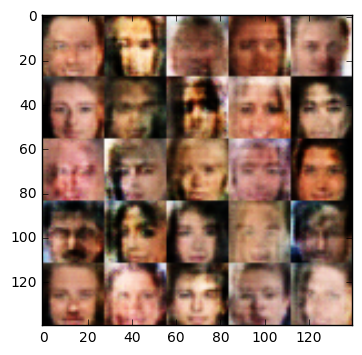

Epoch 1/1... Discriminator Loss: 1.2856... Generator Loss: 0.9175
Epoch 1/1... Discriminator Loss: 1.5945... Generator Loss: 0.3877
Epoch 1/1... Discriminator Loss: 1.2494... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.1986... Generator Loss: 0.9410
Epoch 1/1... Discriminator Loss: 1.0320... Generator Loss: 1.0865
Epoch 1/1... Discriminator Loss: 1.5559... Generator Loss: 0.4352
Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.7989
Epoch 1/1... Discriminator Loss: 0.8469... Generator Loss: 1.5634
Epoch 1/1... Discriminator Loss: 0.8340... Generator Loss: 1.5210
Epoch 1/1... Discriminator Loss: 1.2264... Generator Loss: 0.9327


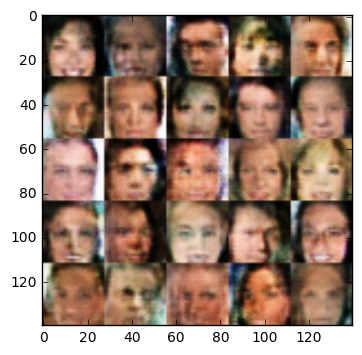

Epoch 1/1... Discriminator Loss: 0.7403... Generator Loss: 1.8913
Epoch 1/1... Discriminator Loss: 0.8206... Generator Loss: 1.1541
Epoch 1/1... Discriminator Loss: 1.2373... Generator Loss: 0.6625
Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.8689
Epoch 1/1... Discriminator Loss: 0.7069... Generator Loss: 1.6782
Epoch 1/1... Discriminator Loss: 1.0388... Generator Loss: 1.6930
Epoch 1/1... Discriminator Loss: 0.8431... Generator Loss: 2.1362
Epoch 1/1... Discriminator Loss: 1.3478... Generator Loss: 1.0058
Epoch 1/1... Discriminator Loss: 0.7822... Generator Loss: 2.3469
Epoch 1/1... Discriminator Loss: 1.4533... Generator Loss: 1.1361


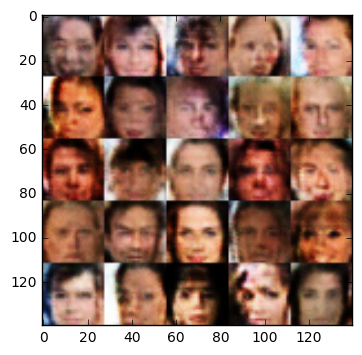

Epoch 1/1... Discriminator Loss: 1.1267... Generator Loss: 1.5784
Epoch 1/1... Discriminator Loss: 0.7836... Generator Loss: 1.3035
Epoch 1/1... Discriminator Loss: 1.1125... Generator Loss: 0.7809
Epoch 1/1... Discriminator Loss: 1.2391... Generator Loss: 0.6131
Epoch 1/1... Discriminator Loss: 0.8687... Generator Loss: 1.9748
Epoch 1/1... Discriminator Loss: 0.9784... Generator Loss: 1.7210
Epoch 1/1... Discriminator Loss: 0.9511... Generator Loss: 1.0780
Epoch 1/1... Discriminator Loss: 1.1101... Generator Loss: 1.5179
Epoch 1/1... Discriminator Loss: 0.6806... Generator Loss: 2.9619
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.7225


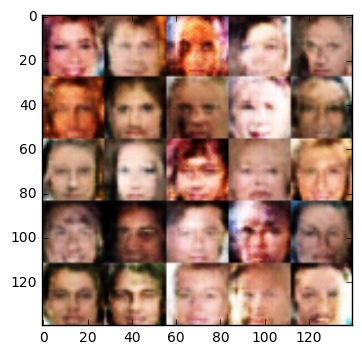

Epoch 1/1... Discriminator Loss: 1.3105... Generator Loss: 0.6239
Epoch 1/1... Discriminator Loss: 1.6411... Generator Loss: 0.4354
Epoch 1/1... Discriminator Loss: 1.1438... Generator Loss: 1.0410
Epoch 1/1... Discriminator Loss: 1.2838... Generator Loss: 0.6975
Epoch 1/1... Discriminator Loss: 1.0406... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 1.0179... Generator Loss: 0.8808
Epoch 1/1... Discriminator Loss: 0.8816... Generator Loss: 1.3059
Epoch 1/1... Discriminator Loss: 1.1015... Generator Loss: 0.7477
Epoch 1/1... Discriminator Loss: 1.5365... Generator Loss: 0.4464
Epoch 1/1... Discriminator Loss: 0.8777... Generator Loss: 1.1304


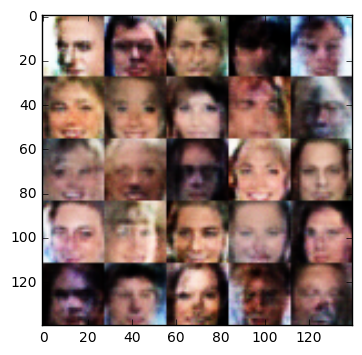

Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.6158
Epoch 1/1... Discriminator Loss: 0.8926... Generator Loss: 1.3101
Epoch 1/1... Discriminator Loss: 1.0394... Generator Loss: 2.7930
Epoch 1/1... Discriminator Loss: 0.7742... Generator Loss: 1.3787
Epoch 1/1... Discriminator Loss: 1.7500... Generator Loss: 0.3254
Epoch 1/1... Discriminator Loss: 1.0752... Generator Loss: 1.9955
Epoch 1/1... Discriminator Loss: 1.4836... Generator Loss: 0.4815
Epoch 1/1... Discriminator Loss: 0.9112... Generator Loss: 1.0099
Epoch 1/1... Discriminator Loss: 1.0960... Generator Loss: 0.8602
Epoch 1/1... Discriminator Loss: 0.8171... Generator Loss: 1.4302


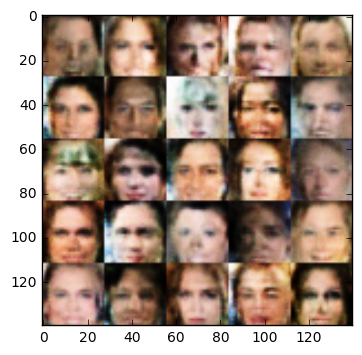

Epoch 1/1... Discriminator Loss: 0.8488... Generator Loss: 1.6645
Epoch 1/1... Discriminator Loss: 1.0308... Generator Loss: 1.4511
Epoch 1/1... Discriminator Loss: 1.3556... Generator Loss: 0.5449
Epoch 1/1... Discriminator Loss: 0.5189... Generator Loss: 2.5110
Epoch 1/1... Discriminator Loss: 0.7703... Generator Loss: 2.0391
Epoch 1/1... Discriminator Loss: 1.0946... Generator Loss: 0.7266
Epoch 1/1... Discriminator Loss: 1.3488... Generator Loss: 0.6231
Epoch 1/1... Discriminator Loss: 0.7788... Generator Loss: 1.2678
Epoch 1/1... Discriminator Loss: 0.9236... Generator Loss: 1.0107
Epoch 1/1... Discriminator Loss: 1.5056... Generator Loss: 0.8408


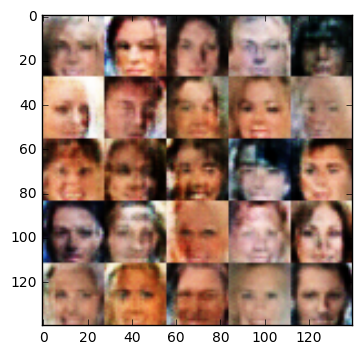

Epoch 1/1... Discriminator Loss: 1.3492... Generator Loss: 0.5127
Epoch 1/1... Discriminator Loss: 1.5091... Generator Loss: 0.4644
Epoch 1/1... Discriminator Loss: 1.2611... Generator Loss: 0.6406
Epoch 1/1... Discriminator Loss: 0.7383... Generator Loss: 1.6108
Epoch 1/1... Discriminator Loss: 1.4689... Generator Loss: 0.4989
Epoch 1/1... Discriminator Loss: 1.1507... Generator Loss: 0.8649
Epoch 1/1... Discriminator Loss: 0.9724... Generator Loss: 1.5443
Epoch 1/1... Discriminator Loss: 0.9038... Generator Loss: 0.9845
Epoch 1/1... Discriminator Loss: 0.6750... Generator Loss: 1.7637
Epoch 1/1... Discriminator Loss: 0.5957... Generator Loss: 2.7445


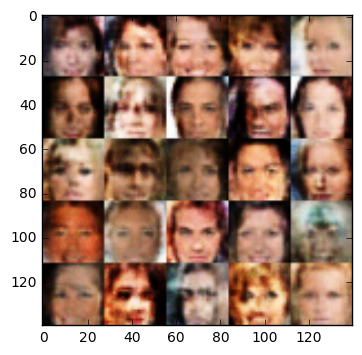

Epoch 1/1... Discriminator Loss: 0.5306... Generator Loss: 1.8654
Epoch 1/1... Discriminator Loss: 2.7257... Generator Loss: 0.1127
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.8849
Epoch 1/1... Discriminator Loss: 0.6834... Generator Loss: 2.2032
Epoch 1/1... Discriminator Loss: 1.1785... Generator Loss: 0.7881
Epoch 1/1... Discriminator Loss: 0.9071... Generator Loss: 1.1488
Epoch 1/1... Discriminator Loss: 1.0326... Generator Loss: 1.0737
Epoch 1/1... Discriminator Loss: 0.8416... Generator Loss: 1.1864
Epoch 1/1... Discriminator Loss: 1.0430... Generator Loss: 0.7833
Epoch 1/1... Discriminator Loss: 0.8611... Generator Loss: 1.3106


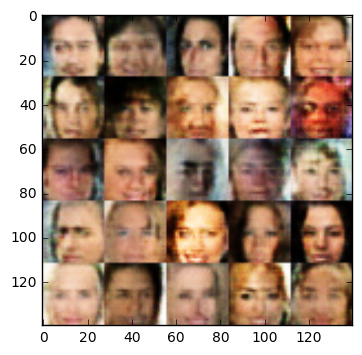

Epoch 1/1... Discriminator Loss: 1.0817... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 0.8814... Generator Loss: 1.4309
Epoch 1/1... Discriminator Loss: 0.7605... Generator Loss: 2.6555
Epoch 1/1... Discriminator Loss: 0.8516... Generator Loss: 2.9489
Epoch 1/1... Discriminator Loss: 1.1539... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 0.6769... Generator Loss: 1.4040
Epoch 1/1... Discriminator Loss: 0.7256... Generator Loss: 2.7705
Epoch 1/1... Discriminator Loss: 0.6337... Generator Loss: 2.8538
Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 1.2241
Epoch 1/1... Discriminator Loss: 0.7690... Generator Loss: 3.4917


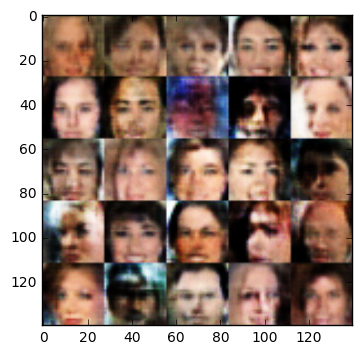

Epoch 1/1... Discriminator Loss: 1.1062... Generator Loss: 2.8400
Epoch 1/1... Discriminator Loss: 0.9017... Generator Loss: 1.6173
Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 1.7677
Epoch 1/1... Discriminator Loss: 1.0356... Generator Loss: 0.8589
Epoch 1/1... Discriminator Loss: 0.9069... Generator Loss: 0.9726
Epoch 1/1... Discriminator Loss: 0.6844... Generator Loss: 1.4817
Epoch 1/1... Discriminator Loss: 0.7423... Generator Loss: 1.2889
Epoch 1/1... Discriminator Loss: 0.7323... Generator Loss: 1.3221
Epoch 1/1... Discriminator Loss: 1.0807... Generator Loss: 1.6217
Epoch 1/1... Discriminator Loss: 0.6739... Generator Loss: 1.8018


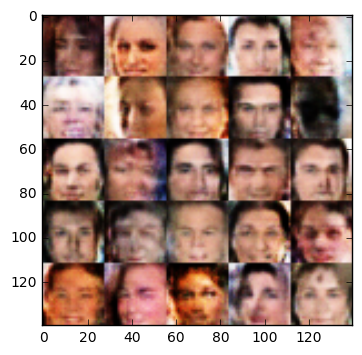

Epoch 1/1... Discriminator Loss: 1.2972... Generator Loss: 0.5671
Epoch 1/1... Discriminator Loss: 0.7792... Generator Loss: 3.5664
Epoch 1/1... Discriminator Loss: 1.0831... Generator Loss: 1.2093
Epoch 1/1... Discriminator Loss: 0.6847... Generator Loss: 1.9817
Epoch 1/1... Discriminator Loss: 0.8392... Generator Loss: 2.2783
Epoch 1/1... Discriminator Loss: 0.7126... Generator Loss: 2.4998
Epoch 1/1... Discriminator Loss: 1.3170... Generator Loss: 0.5957
Epoch 1/1... Discriminator Loss: 0.5652... Generator Loss: 2.6297
Epoch 1/1... Discriminator Loss: 1.1844... Generator Loss: 0.8003
Epoch 1/1... Discriminator Loss: 0.5235... Generator Loss: 2.8225


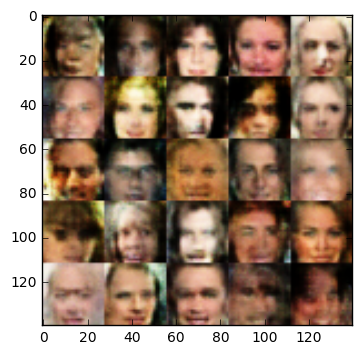

Epoch 1/1... Discriminator Loss: 1.1077... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 0.7048... Generator Loss: 2.9974
Epoch 1/1... Discriminator Loss: 1.1468... Generator Loss: 2.3513
Epoch 1/1... Discriminator Loss: 1.3912... Generator Loss: 0.5376
Epoch 1/1... Discriminator Loss: 0.9899... Generator Loss: 0.8861
Epoch 1/1... Discriminator Loss: 0.8530... Generator Loss: 1.2529
Epoch 1/1... Discriminator Loss: 0.7225... Generator Loss: 1.5278
Epoch 1/1... Discriminator Loss: 0.9678... Generator Loss: 1.3971
Epoch 1/1... Discriminator Loss: 1.3900... Generator Loss: 0.5056
Epoch 1/1... Discriminator Loss: 0.6879... Generator Loss: 1.4794


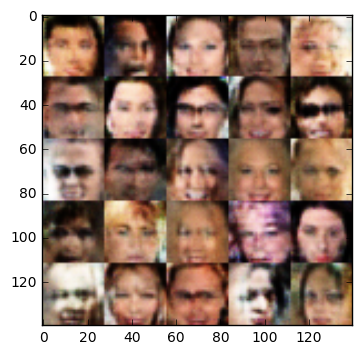

Epoch 1/1... Discriminator Loss: 0.4512... Generator Loss: 2.4450
Epoch 1/1... Discriminator Loss: 0.6289... Generator Loss: 3.2618
Epoch 1/1... Discriminator Loss: 0.6054... Generator Loss: 2.0198
Epoch 1/1... Discriminator Loss: 0.4747... Generator Loss: 3.1700
Epoch 1/1... Discriminator Loss: 0.5131... Generator Loss: 2.3626
Epoch 1/1... Discriminator Loss: 0.5241... Generator Loss: 2.3999
Epoch 1/1... Discriminator Loss: 1.7713... Generator Loss: 0.3060
Epoch 1/1... Discriminator Loss: 0.7446... Generator Loss: 1.4349
Epoch 1/1... Discriminator Loss: 0.7028... Generator Loss: 1.6725
Epoch 1/1... Discriminator Loss: 0.4491... Generator Loss: 3.4018


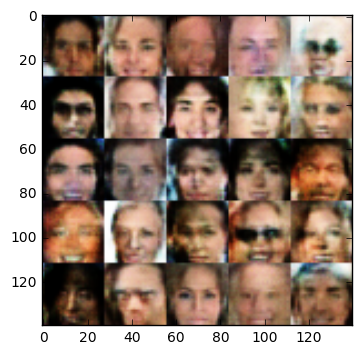

Epoch 1/1... Discriminator Loss: 0.8302... Generator Loss: 1.0951
Epoch 1/1... Discriminator Loss: 0.6554... Generator Loss: 2.5540
Epoch 1/1... Discriminator Loss: 0.9396... Generator Loss: 0.9218
Epoch 1/1... Discriminator Loss: 0.7687... Generator Loss: 1.1839
Epoch 1/1... Discriminator Loss: 0.7361... Generator Loss: 1.3001
Epoch 1/1... Discriminator Loss: 0.6599... Generator Loss: 1.5124
Epoch 1/1... Discriminator Loss: 1.0168... Generator Loss: 0.8387
Epoch 1/1... Discriminator Loss: 0.7758... Generator Loss: 1.2690
Epoch 1/1... Discriminator Loss: 1.0620... Generator Loss: 1.1648
Epoch 1/1... Discriminator Loss: 0.5708... Generator Loss: 2.1684


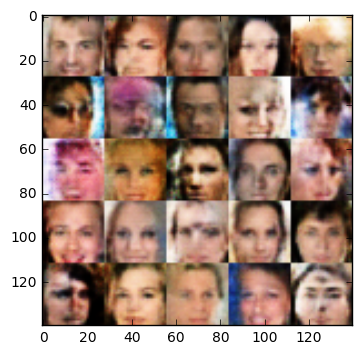

Epoch 1/1... Discriminator Loss: 1.8489... Generator Loss: 0.2999
Epoch 1/1... Discriminator Loss: 0.8580... Generator Loss: 1.1799
Epoch 1/1... Discriminator Loss: 0.7733... Generator Loss: 1.3888
Epoch 1/1... Discriminator Loss: 0.6804... Generator Loss: 2.3896
Epoch 1/1... Discriminator Loss: 0.6844... Generator Loss: 1.4784
Epoch 1/1... Discriminator Loss: 0.6921... Generator Loss: 1.4096
Epoch 1/1... Discriminator Loss: 0.5194... Generator Loss: 2.1805
Epoch 1/1... Discriminator Loss: 0.7177... Generator Loss: 1.4537
Epoch 1/1... Discriminator Loss: 0.4774... Generator Loss: 2.7133
Epoch 1/1... Discriminator Loss: 0.6896... Generator Loss: 5.2741


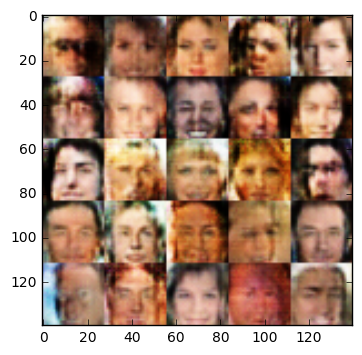

Epoch 1/1... Discriminator Loss: 1.9255... Generator Loss: 0.2900
Epoch 1/1... Discriminator Loss: 0.9656... Generator Loss: 1.0756
Epoch 1/1... Discriminator Loss: 0.8295... Generator Loss: 1.8973
Epoch 1/1... Discriminator Loss: 1.4064... Generator Loss: 0.5001
Epoch 1/1... Discriminator Loss: 0.5647... Generator Loss: 2.4529
Epoch 1/1... Discriminator Loss: 0.5526... Generator Loss: 2.5869
Epoch 1/1... Discriminator Loss: 0.9686... Generator Loss: 0.9577
Epoch 1/1... Discriminator Loss: 0.4896... Generator Loss: 2.2957
Epoch 1/1... Discriminator Loss: 0.8563... Generator Loss: 1.0616
Epoch 1/1... Discriminator Loss: 0.6270... Generator Loss: 1.6726


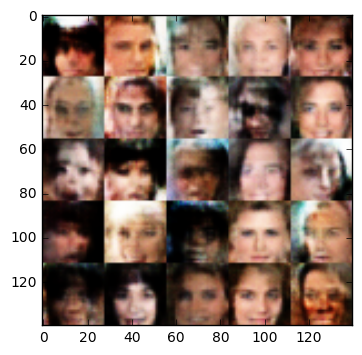

Epoch 1/1... Discriminator Loss: 0.7395... Generator Loss: 1.3459
Epoch 1/1... Discriminator Loss: 0.6510... Generator Loss: 1.6541
Epoch 1/1... Discriminator Loss: 0.8939... Generator Loss: 0.9767
Epoch 1/1... Discriminator Loss: 1.0893... Generator Loss: 0.8999
Epoch 1/1... Discriminator Loss: 2.1072... Generator Loss: 0.2104
Epoch 1/1... Discriminator Loss: 0.7096... Generator Loss: 1.5304
Epoch 1/1... Discriminator Loss: 1.0973... Generator Loss: 0.8120
Epoch 1/1... Discriminator Loss: 1.1049... Generator Loss: 0.7148
Epoch 1/1... Discriminator Loss: 1.4789... Generator Loss: 0.5908
Epoch 1/1... Discriminator Loss: 1.5920... Generator Loss: 0.4381


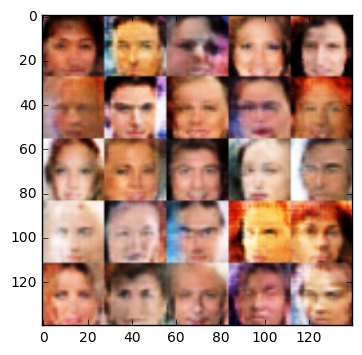

Epoch 1/1... Discriminator Loss: 0.8963... Generator Loss: 4.0710
Epoch 1/1... Discriminator Loss: 1.2762... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 0.6802... Generator Loss: 1.9559
Epoch 1/1... Discriminator Loss: 0.7010... Generator Loss: 1.5290
Epoch 1/1... Discriminator Loss: 0.8895... Generator Loss: 1.0755
Epoch 1/1... Discriminator Loss: 0.5794... Generator Loss: 2.5117
Epoch 1/1... Discriminator Loss: 0.6603... Generator Loss: 1.5290
Epoch 1/1... Discriminator Loss: 0.5294... Generator Loss: 2.1393
Epoch 1/1... Discriminator Loss: 0.5137... Generator Loss: 2.1667
Epoch 1/1... Discriminator Loss: 0.8823... Generator Loss: 1.0804


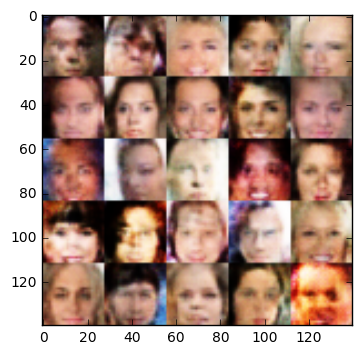

Epoch 1/1... Discriminator Loss: 0.6298... Generator Loss: 1.9042
Epoch 1/1... Discriminator Loss: 1.6163... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.8250... Generator Loss: 0.3062
Epoch 1/1... Discriminator Loss: 0.7361... Generator Loss: 1.3855
Epoch 1/1... Discriminator Loss: 0.7775... Generator Loss: 1.1925
Epoch 1/1... Discriminator Loss: 0.8069... Generator Loss: 2.4064
Epoch 1/1... Discriminator Loss: 0.8715... Generator Loss: 1.3752
Epoch 1/1... Discriminator Loss: 0.7206... Generator Loss: 1.4608
Epoch 1/1... Discriminator Loss: 1.0121... Generator Loss: 0.8486
Epoch 1/1... Discriminator Loss: 1.5411... Generator Loss: 0.4023


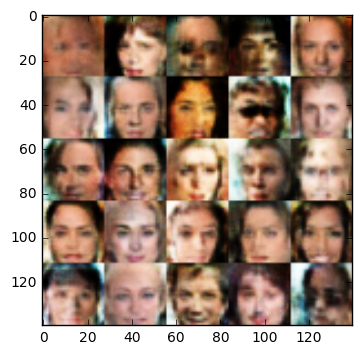

Epoch 1/1... Discriminator Loss: 0.5665... Generator Loss: 2.7176
Epoch 1/1... Discriminator Loss: 0.7057... Generator Loss: 2.0171
Epoch 1/1... Discriminator Loss: 0.7342... Generator Loss: 1.3037
Epoch 1/1... Discriminator Loss: 0.6174... Generator Loss: 1.5363
Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.5188
Epoch 1/1... Discriminator Loss: 1.6513... Generator Loss: 0.4138
Epoch 1/1... Discriminator Loss: 1.0482... Generator Loss: 1.7554
Epoch 1/1... Discriminator Loss: 0.7267... Generator Loss: 1.3963
Epoch 1/1... Discriminator Loss: 0.8930... Generator Loss: 1.1457
Epoch 1/1... Discriminator Loss: 0.5203... Generator Loss: 2.5527


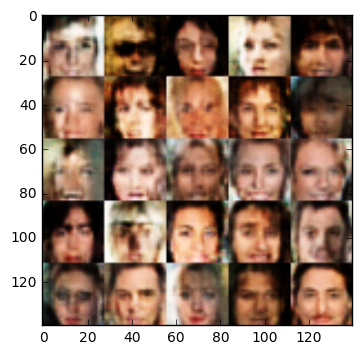

Epoch 1/1... Discriminator Loss: 0.6922... Generator Loss: 2.0834
Epoch 1/1... Discriminator Loss: 0.8609... Generator Loss: 1.1649
Epoch 1/1... Discriminator Loss: 0.6056... Generator Loss: 1.7463
Epoch 1/1... Discriminator Loss: 0.4433... Generator Loss: 3.5397
Epoch 1/1... Discriminator Loss: 1.0299... Generator Loss: 1.2478
Epoch 1/1... Discriminator Loss: 0.5629... Generator Loss: 3.0905
Epoch 1/1... Discriminator Loss: 1.1758... Generator Loss: 1.0583
Epoch 1/1... Discriminator Loss: 0.5045... Generator Loss: 2.5013
Epoch 1/1... Discriminator Loss: 0.5941... Generator Loss: 1.6964
Epoch 1/1... Discriminator Loss: 0.6955... Generator Loss: 1.4747


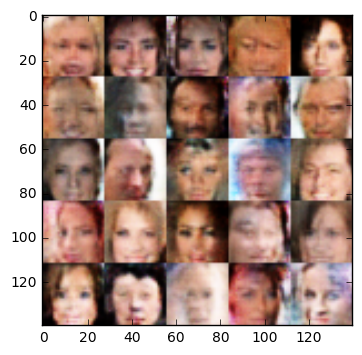

Epoch 1/1... Discriminator Loss: 0.9852... Generator Loss: 1.6018
Epoch 1/1... Discriminator Loss: 0.4946... Generator Loss: 2.1942
Epoch 1/1... Discriminator Loss: 0.5894... Generator Loss: 2.6627
Epoch 1/1... Discriminator Loss: 0.6272... Generator Loss: 1.5954
Epoch 1/1... Discriminator Loss: 0.8133... Generator Loss: 1.1730
Epoch 1/1... Discriminator Loss: 0.8721... Generator Loss: 1.0882
Epoch 1/1... Discriminator Loss: 1.0620... Generator Loss: 1.6341
Epoch 1/1... Discriminator Loss: 0.5581... Generator Loss: 2.1738
Epoch 1/1... Discriminator Loss: 0.7713... Generator Loss: 1.3905
Epoch 1/1... Discriminator Loss: 1.2440... Generator Loss: 0.6825


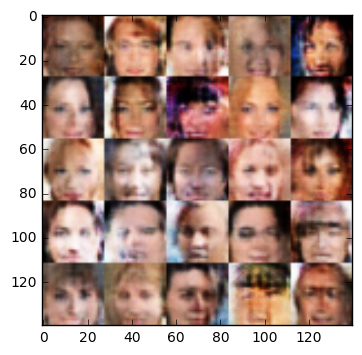

Epoch 1/1... Discriminator Loss: 1.0186... Generator Loss: 1.0812
Epoch 1/1... Discriminator Loss: 0.5953... Generator Loss: 2.3276
Epoch 1/1... Discriminator Loss: 1.0532... Generator Loss: 0.7931
Epoch 1/1... Discriminator Loss: 0.5137... Generator Loss: 2.4065
Epoch 1/1... Discriminator Loss: 0.5231... Generator Loss: 2.2564
Epoch 1/1... Discriminator Loss: 0.5688... Generator Loss: 1.8649
Epoch 1/1... Discriminator Loss: 0.5688... Generator Loss: 2.3811
Epoch 1/1... Discriminator Loss: 0.9457... Generator Loss: 1.7842
Epoch 1/1... Discriminator Loss: 0.7871... Generator Loss: 2.0936
Epoch 1/1... Discriminator Loss: 0.5357... Generator Loss: 2.7776


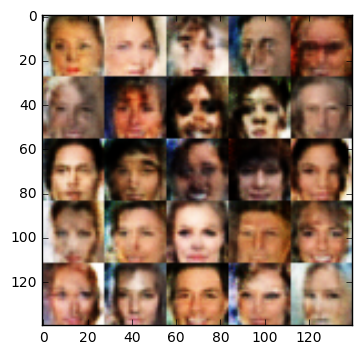

Epoch 1/1... Discriminator Loss: 0.8125... Generator Loss: 1.2628
Epoch 1/1... Discriminator Loss: 0.6460... Generator Loss: 1.6020
Epoch 1/1... Discriminator Loss: 0.8067... Generator Loss: 1.3488
Epoch 1/1... Discriminator Loss: 1.0126... Generator Loss: 0.8364
Epoch 1/1... Discriminator Loss: 0.7714... Generator Loss: 1.7303
Epoch 1/1... Discriminator Loss: 0.5257... Generator Loss: 1.9551
Epoch 1/1... Discriminator Loss: 0.6226... Generator Loss: 1.7365
Epoch 1/1... Discriminator Loss: 0.8112... Generator Loss: 1.2942
Epoch 1/1... Discriminator Loss: 0.4846... Generator Loss: 2.4221
Epoch 1/1... Discriminator Loss: 0.6028... Generator Loss: 1.8204


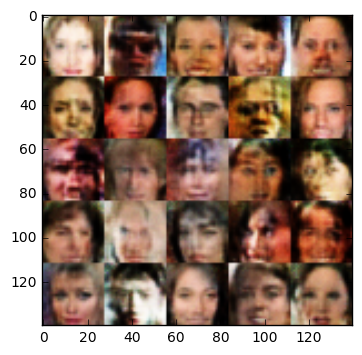

Epoch 1/1... Discriminator Loss: 0.5181... Generator Loss: 1.9830
Epoch 1/1... Discriminator Loss: 1.0013... Generator Loss: 0.9891
Epoch 1/1... Discriminator Loss: 1.6900... Generator Loss: 0.3410
Epoch 1/1... Discriminator Loss: 0.6310... Generator Loss: 1.6771
Epoch 1/1... Discriminator Loss: 2.2814... Generator Loss: 0.2099
Epoch 1/1... Discriminator Loss: 0.6111... Generator Loss: 5.2406
Epoch 1/1... Discriminator Loss: 1.0865... Generator Loss: 0.8436
Epoch 1/1... Discriminator Loss: 0.6001... Generator Loss: 2.0175
Epoch 1/1... Discriminator Loss: 0.5077... Generator Loss: 3.9639
Epoch 1/1... Discriminator Loss: 0.5316... Generator Loss: 2.2944


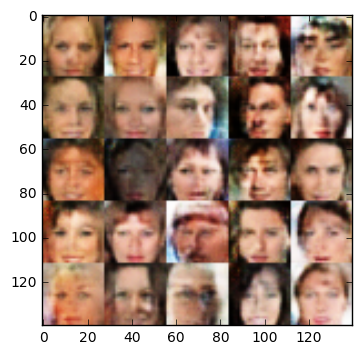

Epoch 1/1... Discriminator Loss: 0.5261... Generator Loss: 2.8219
Epoch 1/1... Discriminator Loss: 0.7982... Generator Loss: 1.1552
Epoch 1/1... Discriminator Loss: 0.7149... Generator Loss: 1.8332
Epoch 1/1... Discriminator Loss: 0.3935... Generator Loss: 3.5312
Epoch 1/1... Discriminator Loss: 0.4836... Generator Loss: 2.2130
Epoch 1/1... Discriminator Loss: 0.5730... Generator Loss: 1.9656
Epoch 1/1... Discriminator Loss: 0.9458... Generator Loss: 0.9623
Epoch 1/1... Discriminator Loss: 0.6976... Generator Loss: 1.6395
Epoch 1/1... Discriminator Loss: 0.5815... Generator Loss: 4.5068
Epoch 1/1... Discriminator Loss: 0.7513... Generator Loss: 1.4416


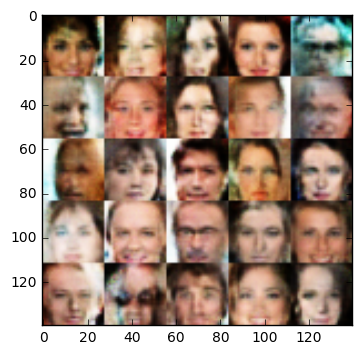

Epoch 1/1... Discriminator Loss: 0.4238... Generator Loss: 2.9649
Epoch 1/1... Discriminator Loss: 0.9212... Generator Loss: 1.6939
Epoch 1/1... Discriminator Loss: 0.7853... Generator Loss: 1.3697
Epoch 1/1... Discriminator Loss: 1.8950... Generator Loss: 0.5711
Epoch 1/1... Discriminator Loss: 0.5530... Generator Loss: 1.9959
Epoch 1/1... Discriminator Loss: 0.5500... Generator Loss: 1.8867
Epoch 1/1... Discriminator Loss: 0.3946... Generator Loss: 3.2850
Epoch 1/1... Discriminator Loss: 0.8514... Generator Loss: 1.2455
Epoch 1/1... Discriminator Loss: 2.3148... Generator Loss: 0.1934
Epoch 1/1... Discriminator Loss: 1.0806... Generator Loss: 0.8676


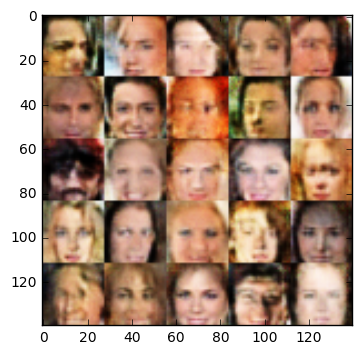

Epoch 1/1... Discriminator Loss: 0.8546... Generator Loss: 1.0319
Epoch 1/1... Discriminator Loss: 0.7020... Generator Loss: 1.8939
Epoch 1/1... Discriminator Loss: 0.5448... Generator Loss: 2.1902
Epoch 1/1... Discriminator Loss: 0.4734... Generator Loss: 2.9940
Epoch 1/1... Discriminator Loss: 0.8407... Generator Loss: 1.1031
Epoch 1/1... Discriminator Loss: 0.6792... Generator Loss: 2.0203
Epoch 1/1... Discriminator Loss: 1.0045... Generator Loss: 0.9213
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.7155
Epoch 1/1... Discriminator Loss: 0.7506... Generator Loss: 1.2878
Epoch 1/1... Discriminator Loss: 0.5701... Generator Loss: 1.7722


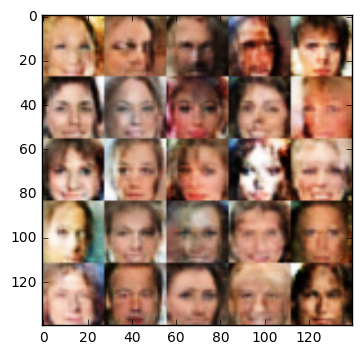

Epoch 1/1... Discriminator Loss: 0.7054... Generator Loss: 1.9354
Epoch 1/1... Discriminator Loss: 0.9624... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 0.5450... Generator Loss: 2.2161
Epoch 1/1... Discriminator Loss: 0.4822... Generator Loss: 2.3936
Epoch 1/1... Discriminator Loss: 0.4383... Generator Loss: 4.5547
Epoch 1/1... Discriminator Loss: 0.7107... Generator Loss: 1.3485
Epoch 1/1... Discriminator Loss: 1.5016... Generator Loss: 0.4072
Epoch 1/1... Discriminator Loss: 0.4448... Generator Loss: 3.7305
Epoch 1/1... Discriminator Loss: 0.4250... Generator Loss: 3.0954
Epoch 1/1... Discriminator Loss: 0.4379... Generator Loss: 2.7603


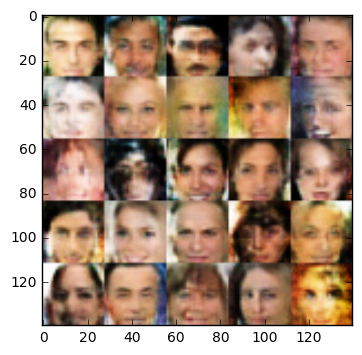

Epoch 1/1... Discriminator Loss: 0.6668... Generator Loss: 2.3528
Epoch 1/1... Discriminator Loss: 0.5373... Generator Loss: 2.3218
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.4719
Epoch 1/1... Discriminator Loss: 0.4571... Generator Loss: 2.9562
Epoch 1/1... Discriminator Loss: 0.4700... Generator Loss: 2.4119
Epoch 1/1... Discriminator Loss: 0.5014... Generator Loss: 2.7692
Epoch 1/1... Discriminator Loss: 0.6537... Generator Loss: 1.9505
Epoch 1/1... Discriminator Loss: 0.5596... Generator Loss: 4.0900
Epoch 1/1... Discriminator Loss: 0.8381... Generator Loss: 1.1009
Epoch 1/1... Discriminator Loss: 0.7648... Generator Loss: 1.3254


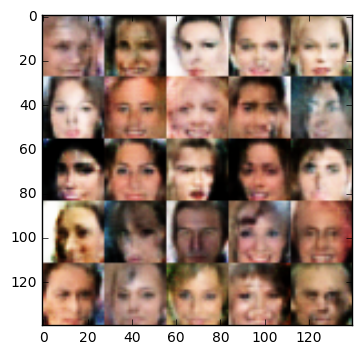

Epoch 1/1... Discriminator Loss: 1.2917... Generator Loss: 2.1241
Epoch 1/1... Discriminator Loss: 0.6230... Generator Loss: 2.5480
Epoch 1/1... Discriminator Loss: 0.7216... Generator Loss: 2.8972
Epoch 1/1... Discriminator Loss: 0.6110... Generator Loss: 3.3053
Epoch 1/1... Discriminator Loss: 0.9029... Generator Loss: 0.9664
Epoch 1/1... Discriminator Loss: 0.6308... Generator Loss: 2.2410
Epoch 1/1... Discriminator Loss: 1.3327... Generator Loss: 0.5127
Epoch 1/1... Discriminator Loss: 0.4366... Generator Loss: 3.9281
Epoch 1/1... Discriminator Loss: 1.0905... Generator Loss: 0.9623
Epoch 1/1... Discriminator Loss: 0.6398... Generator Loss: 2.3579


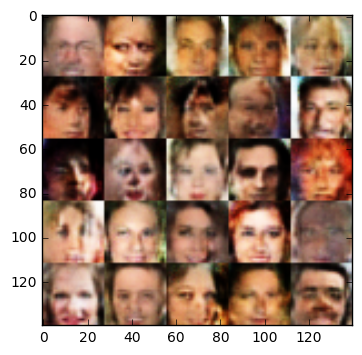

Epoch 1/1... Discriminator Loss: 0.7598... Generator Loss: 1.3142
Epoch 1/1... Discriminator Loss: 0.5738... Generator Loss: 2.2850
Epoch 1/1... Discriminator Loss: 0.7078... Generator Loss: 2.7611
Epoch 1/1... Discriminator Loss: 1.0879... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 1.5130... Generator Loss: 0.4553
Epoch 1/1... Discriminator Loss: 0.6193... Generator Loss: 2.3778
Epoch 1/1... Discriminator Loss: 1.2636... Generator Loss: 0.5712
Epoch 1/1... Discriminator Loss: 0.8682... Generator Loss: 1.7149
Epoch 1/1... Discriminator Loss: 0.6561... Generator Loss: 1.6869
Epoch 1/1... Discriminator Loss: 0.6013... Generator Loss: 1.7492


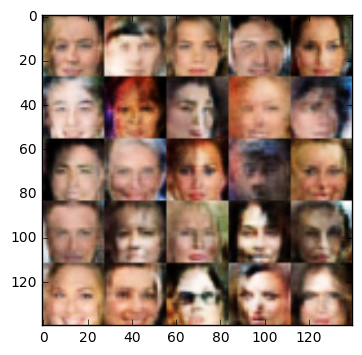

Epoch 1/1... Discriminator Loss: 0.7644... Generator Loss: 1.6440
Epoch 1/1... Discriminator Loss: 0.7038... Generator Loss: 1.3961
Epoch 1/1... Discriminator Loss: 0.5913... Generator Loss: 2.6049
Epoch 1/1... Discriminator Loss: 0.5967... Generator Loss: 2.7709
Epoch 1/1... Discriminator Loss: 0.5976... Generator Loss: 1.7827
Epoch 1/1... Discriminator Loss: 0.8794... Generator Loss: 1.1938
Epoch 1/1... Discriminator Loss: 1.1239... Generator Loss: 1.5117
Epoch 1/1... Discriminator Loss: 1.2181... Generator Loss: 0.6819
Epoch 1/1... Discriminator Loss: 1.0977... Generator Loss: 1.4496
Epoch 1/1... Discriminator Loss: 1.1047... Generator Loss: 0.7537


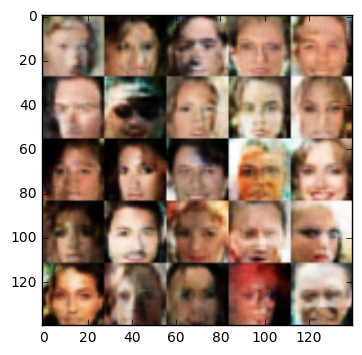

Epoch 1/1... Discriminator Loss: 0.8688... Generator Loss: 1.2040
Epoch 1/1... Discriminator Loss: 0.4658... Generator Loss: 4.6608
Epoch 1/1... Discriminator Loss: 0.4804... Generator Loss: 4.0040
Epoch 1/1... Discriminator Loss: 0.6897... Generator Loss: 1.4446
Epoch 1/1... Discriminator Loss: 0.5974... Generator Loss: 3.9699
Epoch 1/1... Discriminator Loss: 0.8281... Generator Loss: 1.0898
Epoch 1/1... Discriminator Loss: 0.6752... Generator Loss: 2.5175
Epoch 1/1... Discriminator Loss: 0.4710... Generator Loss: 2.7651
Epoch 1/1... Discriminator Loss: 1.0233... Generator Loss: 0.9047
Epoch 1/1... Discriminator Loss: 0.6039... Generator Loss: 1.9384


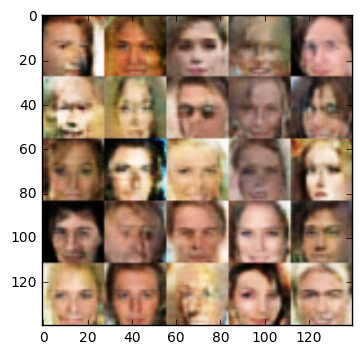

Epoch 1/1... Discriminator Loss: 0.5436... Generator Loss: 1.9425
Epoch 1/1... Discriminator Loss: 0.4592... Generator Loss: 3.2753
Epoch 1/1... Discriminator Loss: 0.5381... Generator Loss: 2.0019
Epoch 1/1... Discriminator Loss: 0.5708... Generator Loss: 2.3187
Epoch 1/1... Discriminator Loss: 0.5671... Generator Loss: 3.3054
Epoch 1/1... Discriminator Loss: 0.5050... Generator Loss: 2.2253
Epoch 1/1... Discriminator Loss: 0.8475... Generator Loss: 1.6493
Epoch 1/1... Discriminator Loss: 0.7509... Generator Loss: 1.4517
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.6487
Epoch 1/1... Discriminator Loss: 0.9117... Generator Loss: 1.0880


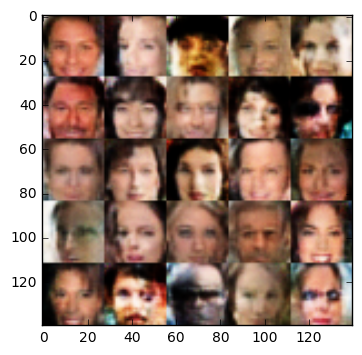

Epoch 1/1... Discriminator Loss: 0.6159... Generator Loss: 1.9269
Epoch 1/1... Discriminator Loss: 0.8967... Generator Loss: 1.1004
Epoch 1/1... Discriminator Loss: 0.7466... Generator Loss: 3.0436
Epoch 1/1... Discriminator Loss: 0.5266... Generator Loss: 3.3123
Epoch 1/1... Discriminator Loss: 0.4799... Generator Loss: 3.4830
Epoch 1/1... Discriminator Loss: 1.0836... Generator Loss: 0.7797
Epoch 1/1... Discriminator Loss: 0.6657... Generator Loss: 1.6561
Epoch 1/1... Discriminator Loss: 0.5914... Generator Loss: 3.0103
Epoch 1/1... Discriminator Loss: 1.7447... Generator Loss: 0.9721
Epoch 1/1... Discriminator Loss: 0.8688... Generator Loss: 1.0592


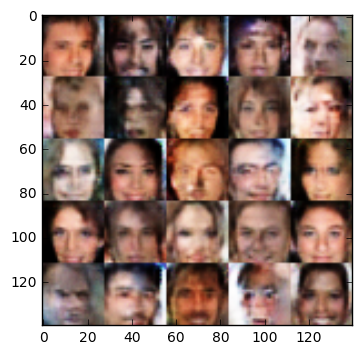

Epoch 1/1... Discriminator Loss: 1.0209... Generator Loss: 0.8290
Epoch 1/1... Discriminator Loss: 1.2272... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 0.5108... Generator Loss: 2.5061
Epoch 1/1... Discriminator Loss: 0.7837... Generator Loss: 1.5454
Epoch 1/1... Discriminator Loss: 0.4215... Generator Loss: 3.1120
Epoch 1/1... Discriminator Loss: 1.0422... Generator Loss: 0.8345
Epoch 1/1... Discriminator Loss: 0.9615... Generator Loss: 0.8773
Epoch 1/1... Discriminator Loss: 0.7285... Generator Loss: 2.4986
Epoch 1/1... Discriminator Loss: 0.4854... Generator Loss: 2.6053
Epoch 1/1... Discriminator Loss: 0.9823... Generator Loss: 3.2480


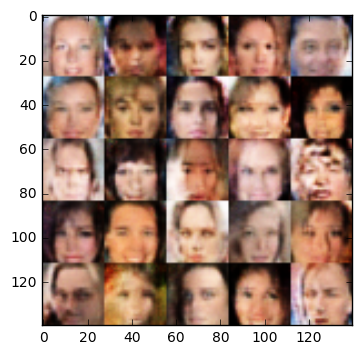

Epoch 1/1... Discriminator Loss: 0.3994... Generator Loss: 3.5517
Epoch 1/1... Discriminator Loss: 0.4879... Generator Loss: 2.4530
Epoch 1/1... Discriminator Loss: 0.8865... Generator Loss: 1.0678
Epoch 1/1... Discriminator Loss: 0.3878... Generator Loss: 3.4088
Epoch 1/1... Discriminator Loss: 0.5251... Generator Loss: 3.2519
Epoch 1/1... Discriminator Loss: 1.6884... Generator Loss: 0.3954
Epoch 1/1... Discriminator Loss: 0.4978... Generator Loss: 2.2818
Epoch 1/1... Discriminator Loss: 0.6104... Generator Loss: 2.0027
Epoch 1/1... Discriminator Loss: 0.4686... Generator Loss: 2.8119
Epoch 1/1... Discriminator Loss: 0.5129... Generator Loss: 3.8084


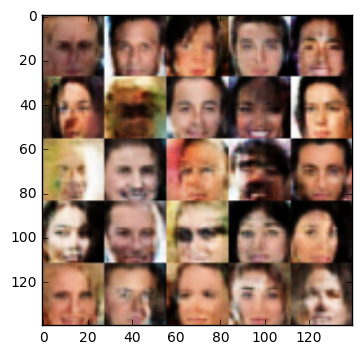

Epoch 1/1... Discriminator Loss: 2.2509... Generator Loss: 0.2366
Epoch 1/1... Discriminator Loss: 0.5959... Generator Loss: 1.7693
Epoch 1/1... Discriminator Loss: 0.5640... Generator Loss: 1.8537
Epoch 1/1... Discriminator Loss: 0.4222... Generator Loss: 3.5624
Epoch 1/1... Discriminator Loss: 0.7303... Generator Loss: 1.2848
Epoch 1/1... Discriminator Loss: 0.7250... Generator Loss: 1.4087
Epoch 1/1... Discriminator Loss: 0.6774... Generator Loss: 2.3578
Epoch 1/1... Discriminator Loss: 1.0781... Generator Loss: 0.9137
Epoch 1/1... Discriminator Loss: 0.9171... Generator Loss: 0.9589
Epoch 1/1... Discriminator Loss: 0.4899... Generator Loss: 3.0216


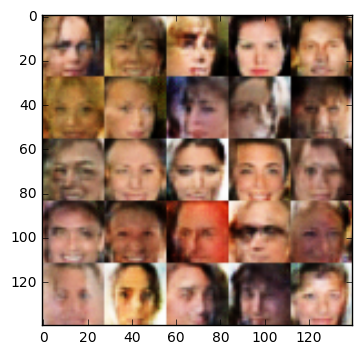

Epoch 1/1... Discriminator Loss: 1.2797... Generator Loss: 0.6255
Epoch 1/1... Discriminator Loss: 0.5366... Generator Loss: 2.7002
Epoch 1/1... Discriminator Loss: 0.5474... Generator Loss: 2.0203
Epoch 1/1... Discriminator Loss: 1.0537... Generator Loss: 1.3524
Epoch 1/1... Discriminator Loss: 0.4294... Generator Loss: 4.7953
Epoch 1/1... Discriminator Loss: 0.3535... Generator Loss: 4.5209
Epoch 1/1... Discriminator Loss: 1.1390... Generator Loss: 3.5082
Epoch 1/1... Discriminator Loss: 0.9610... Generator Loss: 1.4075
Epoch 1/1... Discriminator Loss: 0.7309... Generator Loss: 1.8296
Epoch 1/1... Discriminator Loss: 0.4645... Generator Loss: 3.0902


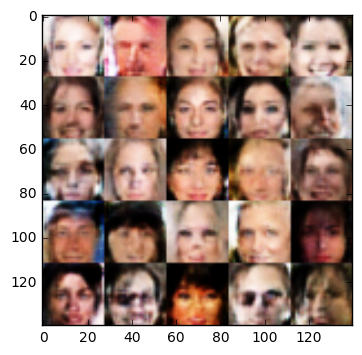

Epoch 1/1... Discriminator Loss: 1.4483... Generator Loss: 0.4524
Epoch 1/1... Discriminator Loss: 0.6013... Generator Loss: 1.6639
Epoch 1/1... Discriminator Loss: 0.5336... Generator Loss: 3.2989
Epoch 1/1... Discriminator Loss: 0.9784... Generator Loss: 0.8800
Epoch 1/1... Discriminator Loss: 1.3092... Generator Loss: 0.5888
Epoch 1/1... Discriminator Loss: 0.6563... Generator Loss: 1.9950
Epoch 1/1... Discriminator Loss: 1.2482... Generator Loss: 1.4833
Epoch 1/1... Discriminator Loss: 0.8931... Generator Loss: 0.9765
Epoch 1/1... Discriminator Loss: 0.5173... Generator Loss: 2.3460
Epoch 1/1... Discriminator Loss: 0.7570... Generator Loss: 1.3160


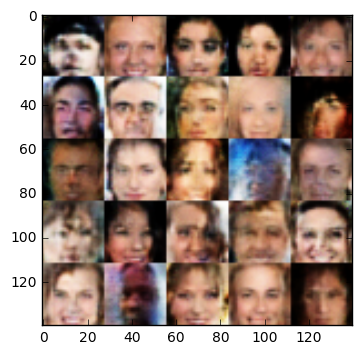

Epoch 1/1... Discriminator Loss: 0.7238... Generator Loss: 1.3425
Epoch 1/1... Discriminator Loss: 0.7129... Generator Loss: 1.4062
Epoch 1/1... Discriminator Loss: 0.5757... Generator Loss: 1.8925
Epoch 1/1... Discriminator Loss: 0.5829... Generator Loss: 3.0041
Epoch 1/1... Discriminator Loss: 0.5681... Generator Loss: 1.7901
Epoch 1/1... Discriminator Loss: 0.6298... Generator Loss: 1.8065
Epoch 1/1... Discriminator Loss: 0.5053... Generator Loss: 2.0749
Epoch 1/1... Discriminator Loss: 0.6847... Generator Loss: 2.1147
Epoch 1/1... Discriminator Loss: 0.8668... Generator Loss: 1.1492
Epoch 1/1... Discriminator Loss: 0.3944... Generator Loss: 3.9689


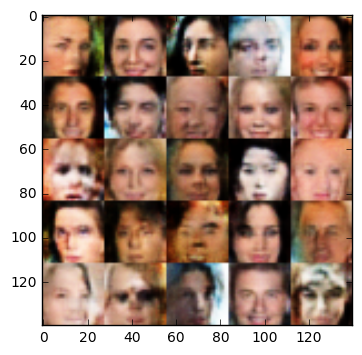

Epoch 1/1... Discriminator Loss: 0.7723... Generator Loss: 1.1430
Epoch 1/1... Discriminator Loss: 0.5524... Generator Loss: 1.9615
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.6433
Epoch 1/1... Discriminator Loss: 0.7057... Generator Loss: 1.9288
Epoch 1/1... Discriminator Loss: 0.7531... Generator Loss: 1.5618
Epoch 1/1... Discriminator Loss: 0.5572... Generator Loss: 2.1041
Epoch 1/1... Discriminator Loss: 1.1624... Generator Loss: 0.6984
Epoch 1/1... Discriminator Loss: 0.5319... Generator Loss: 3.0519
Epoch 1/1... Discriminator Loss: 0.6968... Generator Loss: 3.6961
Epoch 1/1... Discriminator Loss: 0.4574... Generator Loss: 2.9720


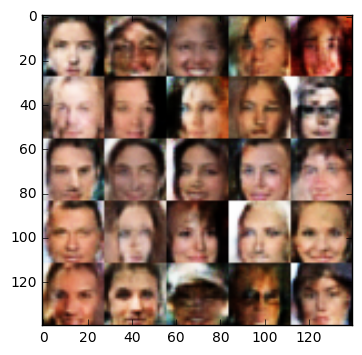

Epoch 1/1... Discriminator Loss: 0.5989... Generator Loss: 1.6973
Epoch 1/1... Discriminator Loss: 0.6114... Generator Loss: 3.2164
Epoch 1/1... Discriminator Loss: 0.6989... Generator Loss: 1.4093
Epoch 1/1... Discriminator Loss: 0.7734... Generator Loss: 1.3721
Epoch 1/1... Discriminator Loss: 0.4977... Generator Loss: 2.3844
Epoch 1/1... Discriminator Loss: 0.6511... Generator Loss: 2.0400
Epoch 1/1... Discriminator Loss: 0.6721... Generator Loss: 1.4382
Epoch 1/1... Discriminator Loss: 0.6107... Generator Loss: 1.9463
Epoch 1/1... Discriminator Loss: 0.7181... Generator Loss: 1.3614
Epoch 1/1... Discriminator Loss: 0.7018... Generator Loss: 1.5087


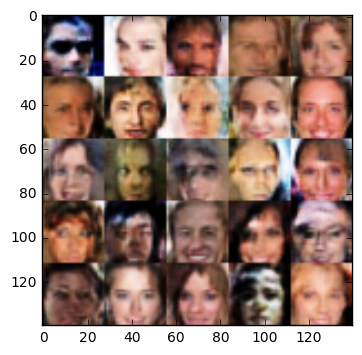

Epoch 1/1... Discriminator Loss: 0.4928... Generator Loss: 2.4613
Epoch 1/1... Discriminator Loss: 0.8825... Generator Loss: 1.1695
Epoch 1/1... Discriminator Loss: 0.5867... Generator Loss: 1.8138
Epoch 1/1... Discriminator Loss: 0.7152... Generator Loss: 1.5520
Epoch 1/1... Discriminator Loss: 0.4303... Generator Loss: 3.0559
Epoch 1/1... Discriminator Loss: 0.4216... Generator Loss: 3.4454
Epoch 1/1... Discriminator Loss: 0.4666... Generator Loss: 2.4773
Epoch 1/1... Discriminator Loss: 1.0743... Generator Loss: 4.2040
Epoch 1/1... Discriminator Loss: 0.4233... Generator Loss: 3.2170
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.6172


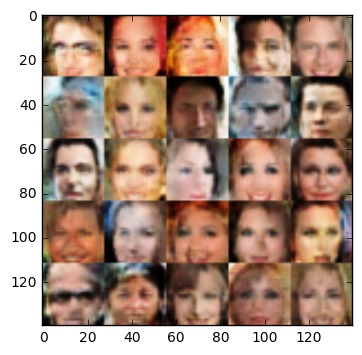

Epoch 1/1... Discriminator Loss: 0.7573... Generator Loss: 2.5486
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.6219
Epoch 1/1... Discriminator Loss: 1.0166... Generator Loss: 0.8508
Epoch 1/1... Discriminator Loss: 0.8689... Generator Loss: 1.0880
Epoch 1/1... Discriminator Loss: 0.5412... Generator Loss: 2.1871
Epoch 1/1... Discriminator Loss: 0.4698... Generator Loss: 3.6397
Epoch 1/1... Discriminator Loss: 0.5074... Generator Loss: 2.6928
Epoch 1/1... Discriminator Loss: 1.0520... Generator Loss: 0.8225
Epoch 1/1... Discriminator Loss: 0.7794... Generator Loss: 1.5923
Epoch 1/1... Discriminator Loss: 0.7007... Generator Loss: 2.0421


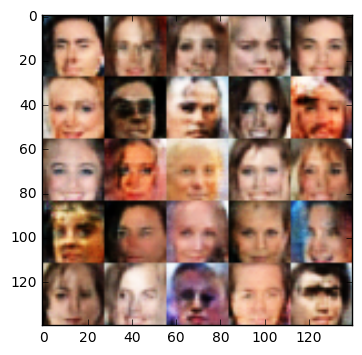

Epoch 1/1... Discriminator Loss: 0.8539... Generator Loss: 1.6465
Epoch 1/1... Discriminator Loss: 0.7441... Generator Loss: 1.6192
Epoch 1/1... Discriminator Loss: 0.4240... Generator Loss: 3.0914
Epoch 1/1... Discriminator Loss: 0.6872... Generator Loss: 1.5007
Epoch 1/1... Discriminator Loss: 0.6043... Generator Loss: 1.6718
Epoch 1/1... Discriminator Loss: 0.8266... Generator Loss: 1.2189
Epoch 1/1... Discriminator Loss: 0.8094... Generator Loss: 2.9162
Epoch 1/1... Discriminator Loss: 0.5145... Generator Loss: 2.5692
Epoch 1/1... Discriminator Loss: 1.1940... Generator Loss: 0.6391
Epoch 1/1... Discriminator Loss: 0.8688... Generator Loss: 1.0980


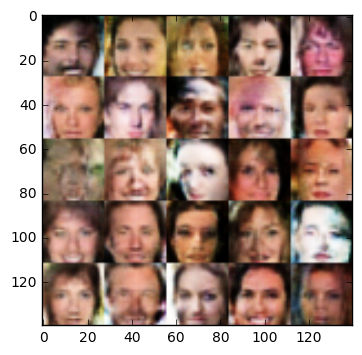

Epoch 1/1... Discriminator Loss: 0.9470... Generator Loss: 0.9187
Epoch 1/1... Discriminator Loss: 0.7944... Generator Loss: 1.4058
Epoch 1/1... Discriminator Loss: 0.5569... Generator Loss: 2.3294
Epoch 1/1... Discriminator Loss: 0.7707... Generator Loss: 1.6196


In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.